
 ## DeePlexiCon
 ### Analyse and demultiplex Oxford Nanopore RNA barcoded with DNA Adaptors Directly from the Signal
 
 Supplement Jupyter Notebook for the paper "Barcoding and demultiplexing Oxford Nanopore direct RNA sequencing reads using deep learning"
 
Preparation:


In [1]:
# System support
from __future__ import print_function
import os
import platform
from copy import deepcopy
import re
import csv
import time
import configparser
# Math,Numpy and plot
import math
import numpy as np
import matplotlib
from matplotlib import rcParams
rcParams['pdf.fonttype'] = 42
rcParams['ps.fonttype'] = 42
import matplotlib.cm as cm
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
#import PIL
#from PIL import Image
# Time series to 2D
import pyts
# Tensorflow - Keras
import tensorflow as tf
import keras
from keras.layers import Dense, Conv2D, BatchNormalization, Activation
from keras.layers import AveragePooling2D, Input, Flatten
from keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint, LearningRateScheduler
from keras.callbacks import ReduceLROnPlateau
from keras.preprocessing.image import ImageDataGenerator
from keras.utils import multi_gpu_model
from keras.regularizers import l2
from keras import backend as K
from keras.models import Model
# Datasets, train test split
import pandas as pd
import sklearn
from sklearn import datasets, linear_model
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
import pandas as pd

import seaborn as sn

Using TensorFlow backend.


In [2]:
def version_from_system(package):
    pkg_info=!pip show {package}
    return(pkg_info[1][9:])   

print("Python       version :",platform.python_version())
print("pip          version :",version_from_system('pip'))
print("Tensorflow   version :",tf.__version__)
print("Keras        version :",keras.__version__)
print("Numpy        version :",np.__version__)
print("Matplotlib   version :",matplotlib.__version__)
print("Pandas       version :",pd.__version__)
print("PyTs         version :",pyts.__version__)
print("Scikit-learn version :",sklearn.__version__)
#print("PIL          version :",PIL.__version__)
print("Seaborn      version :",sn.__version__)
print("PYCM         version :",version_from_system('pycm'))

Python       version : 3.7.3
pip          version : 19.1.1
Tensorflow   version : 1.13.1
Keras        version : 2.2.4
Numpy        version : 1.16.4
Matplotlib   version : 3.1.0
Pandas       version : 0.25.0
PyTs         version : 0.8.0
Scikit-learn version : 0.21.2
Seaborn      version : 0.9.0
PYCM         version : 2.4


In [62]:
# Parameters
run='pAmps-rep3-test2'
gpus=1
epochs=40
input_cut=70000
input_data_paths=['/data/nanopore/James/Barcodes/rep3']
input_segment_paths=['/data/nanopore/James/Barcodes/rep3']#, '/data/nanopore/James/Barcodes/final-07-19/seg/rep2-split']
squiggle_max=199.0
squiggle_min=10
print_details_for=20
max_sample=45000
read_max=130000
smooth_by=10
num_classes=4
label_index=0
save_figures=True

In [63]:
10# Python timeseries interface
from pyts.image import MarkovTransitionField, GramianAngularField, RecurrencePlot
font = {'family': 'serif',
        'color':  'black',
        'weight': 'normal',
        'size': 6,
        }
# Python timeseries interface
def pyts_transform(name,transform,data,image_size,show=False,cmap='rainbow',img_index=0):
    try:
        X_transform = transform.fit_transform(data)
        if (show):
            tcn=transform.__class__.__name__
            if hasattr(transform, 'method'):
                tcn=tcn+'-'+transform.method
            plt.figure(figsize=(4, 4))
            plt.grid(b=None)
            plt.title(name,fontdict=font)
            plt.imshow(X_transform[0], cmap=cmap, origin='lower')
            if save_figures: plt.savefig(name+'-'+tcn+"_image_"+ str(img_index)+".svg", format="svg")
            plt.show()
        return(X_transform)
    except Exception as e:
        print('Error:', str(e))
        return([])
        
def mtf_transform(name,data,image_size = 500,show=False,img_index=0):
    transform = MarkovTransitionField(image_size)    
    return(name,pyts_transform(name,transform,data,image_size = image_size,show=show,cmap='rainbow',img_index=img_index))
    
def rp_transform(name,data,image_size = 500,show=False,img_index=0):
    # RP transformation
    transform = RecurrencePlot(dimension=1, 
                    threshold='percentage_points',
                    percentage=30)
    return(pyts_transform(name,transform,data,image_size = image_size,show=show,cmap='binary',img_index=img_index))
    
def gasf_transform(name,data,image_size = 500,show=False,img_index=0):
    # GAF transformation
    transform = GramianAngularField(image_size, method='summation')
    return(pyts_transform(name,transform,data,image_size = image_size,show=show,cmap='rainbow',img_index=img_index))

def gadf_transform(name,data,image_size = 500,show=False,img_index=0):
    # GAF transformation
    transform = GramianAngularField(image_size, method='difference')
    return(name,pyts_transform(name,transform,data,image_size = image_size,show=show,cmap='rainbow',img_index=img_index))
     


In [64]:
def all_files_in_path(input_path,prefix, extension):
    return([f for f in os.listdir(input_path) if f.startswith(prefix) & f.endswith(extension)])

def full_paths_for_files_in_path(input_path,prefix, extension):
    return([input_path+'/'+f for f in os.listdir(input_path) if f.startswith(prefix) & f.endswith(extension)])

def labels_for(file_name):
    segments=re.split(r'[_\-\.]+', file_name)
    return(segments)

def label_for(file_name):
    return('BC'+labels_for(file_name)[label_index][-1])

def max_in_sequence(sequence):   
    return(max(np.amax([list(d.values()) for d in sequence]),0.01))

In [6]:
for file_name in all_files_in_path(input_segment_paths[0],'', 'dmux.tsv'):
    print(file_name,label_for(file_name))

BC3-R1_103.txt_dmux.tsv BC1
BC1-R2_63.txt_dmux.tsv BC2
BC4-R1_117.txt_dmux.tsv BC1
BC2-R1_81.txt_dmux.tsv BC1


In [15]:
def read_segment_files(paths,postfix,usecols=[0,1,2, 8,9],index_column=1, names=['source','read_id','barcode', 'segment_start','segment_end']):
    all_segment_files=[]
    for path in paths:
        all_segment_files=all_segment_files+full_paths_for_files_in_path(path,'',postfix)
    print("Reading segment files:", all_segment_files)
    segments=[]
    for f in all_segment_files:
        segment_label=label_for(os.path.basename(f)) # Assuming Linux, may fail with Windows
        segment=pd.read_table(f, usecols=usecols, names=names, index_col=index_column, header=None, sep="\t",skiprows=[0])
        segment['label']=segment_label
        segments.append(segment)
    segments=pd.concat(segments)
    print(len(segments))
    segments = segments[~segments.index.duplicated(keep='first')]
    print(len(segments))
    return(segments)

In [16]:
print(full_paths_for_files_in_path(input_segment_paths[0],'', '.tsv'))

['/data/nanopore/James/Barcodes/rep3/BC1-R2_63.txt_squiggle.tsv', '/data/nanopore/James/Barcodes/rep3/BC3-R1_103.txt_squiggle.tsv', '/data/nanopore/James/Barcodes/rep3/BC3-R1_103.txt_dmux.tsv', '/data/nanopore/James/Barcodes/rep3/BC2-R1_81.txt_squiggle.tsv', '/data/nanopore/James/Barcodes/rep3/BC1-R2_63.txt_dmux.tsv', '/data/nanopore/James/Barcodes/rep3/BC4-R1_117.txt_dmux.tsv', '/data/nanopore/James/Barcodes/rep3/BC2-R1_81.txt_dmux.tsv', '/data/nanopore/James/Barcodes/rep3/BC4-R1_117.txt_squiggle.tsv']


In [17]:
segments=read_segment_files(input_segment_paths, 'dmux.tsv')
segments

Reading segment files: ['/data/nanopore/James/Barcodes/rep3/BC3-R1_103.txt_dmux.tsv', '/data/nanopore/James/Barcodes/rep3/BC1-R2_63.txt_dmux.tsv', '/data/nanopore/James/Barcodes/rep3/BC4-R1_117.txt_dmux.tsv', '/data/nanopore/James/Barcodes/rep3/BC2-R1_81.txt_dmux.tsv']
124174
124174


,source,barcode,segment_start,segment_end,label
read_id,,,,,
060d2cec-479b-4b65-a0aa-e96e48152a50,FAK77749_91dd89d0fb1fe7b994a543195a5a455c265ff...,bc_2,999,6831,BC3
07682178-2a81-4d94-b27f-96df4d5c26e5,FAK77749_91dd89d0fb1fe7b994a543195a5a455c265ff...,bc_3,999,8405,BC3
0c9ab90c-6dac-4eb3-8a96-5e7093ba5d3e,FAK77749_91dd89d0fb1fe7b994a543195a5a455c265ff...,bc_3,999,6048,BC3
0ed6a82a-9048-453b-b607-6388309442e9,FAK77749_91dd89d0fb1fe7b994a543195a5a455c265ff...,bc_2,999,15115,BC3
10148d57-13e7-42b9-ae1e-b0941e1b0a2e,FAK77749_91dd89d0fb1fe7b994a543195a5a455c265ff...,bc_4,11414,16850,BC3
129a6de0-13e6-4c98-a694-b94725790689,FAK77749_91dd89d0fb1fe7b994a543195a5a455c265ff...,bc_3,999,10082,BC3
17dc9f5b-d93c-4591-8065-802f324d9f0b,FAK77749_91dd89d0fb1fe7b994a543195a5a455c265ff...,bc_2,999,4172,BC3
1c06c6a0-6948-4871-92f6-d270fe49c84c,FAK77749_91dd89d0fb1fe7b994a543195a5a455c265ff...,bc_2,10531,13778,BC3
1cc6e8b4-1bad-4ffa-9485-2e686b088e0d,FAK77749_91dd89d0fb1fe7b994a543195a5a455c265ff...,bc_4,999,5570,BC3


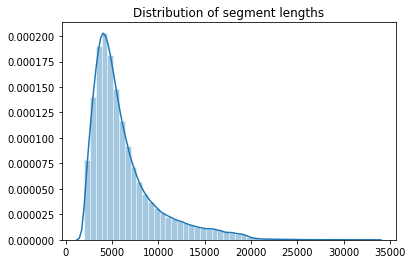

In [18]:
from matplotlib.ticker import FuncFormatter

seg_lengths=segments['segment_end']-segments['segment_start']+1
#seg_lengths=seg_lengths[seg_lengths<20000]
#print(seg_lengths[0:20])

plt.figure("Distribution of segment lengths")
plt.title("Distribution of segment lengths")
sn.set(rc={'figure.figsize':(18.7,10.27)})
sn.set_style("whitegrid")
sn.distplot(seg_lengths)#, bins=100, kde=False, color="blue", label="S1")
#plt.legend()
if save_figures: plt.savefig("seglengthdist1.svg", format="svg")
plt.show()
seg_lengths=None


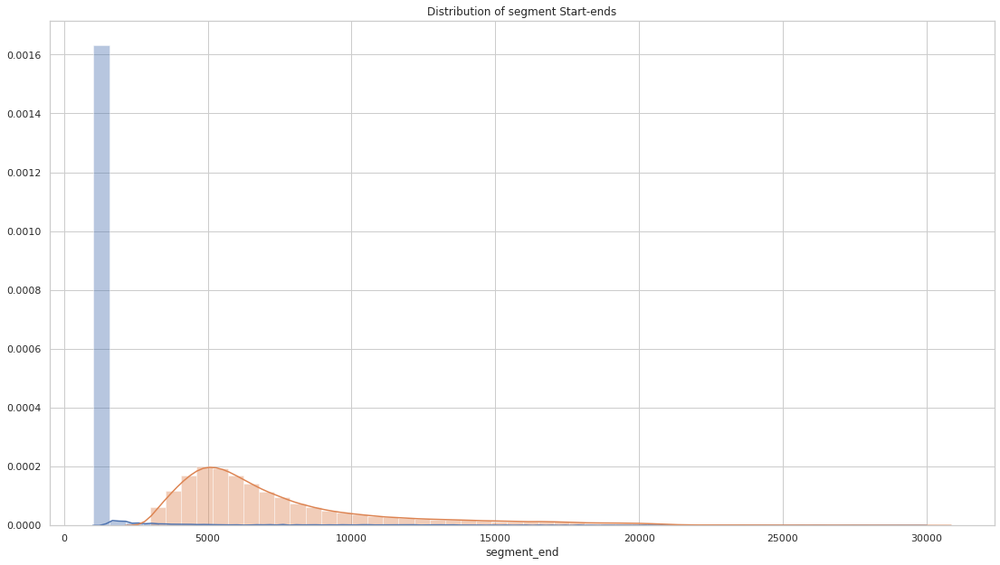

In [19]:

plt.figure("Distribution of segment Start-ends")
plt.title("Distribution of segment Start-ends")
sn.set(rc={'figure.figsize':(18.7,10.27)})
sn.set_style("whitegrid")
sn.distplot(segments['segment_start'][segments['segment_start']<30000])#, bins=100, kde=False, color="blue", label="S1")
sn.distplot(segments['segment_end'][segments['segment_end']<30000])#, bins=100, kde=False, color="blue", label="S1")
#plt.legend()
if save_figures: plt.savefig("segst-end-dist1.svg", format="svg")
plt.show()



In [12]:
segments.loc['MinION_2_20181120_FAK26690_MN27184_sequencing_run_RNA201120181_55646_read_10454_ch_182_strand.fast5']

source           425a2d71-c621-4e22-98b8-bbb2ec5db2b4
segment_start                                    7497
segment_end                                     11931
label                                             BC4
Name: MinION_2_20181120_FAK26690_MN27184_sequencing_run_RNA201120181_55646_read_10454_ch_182_strand.fast5, dtype: object

In [20]:
segments.describe()

,segment_start,segment_end
count,124174.000000,124174.000000
mean,1432.472828,7692.954217
std,2616.593919,4391.502709
min,999.000000,2999.000000
25%,999.000000,4932.000000
50%,999.000000,6287.500000
75%,999.000000,8837.000000
max,98200.000000,100511.000000


In [21]:
far_ends= segments[segments['segment_end']>30000]

In [22]:
long_segments= segments[(segments['segment_end']-segments['segment_start'])>30000]

In [23]:
far_ends

,source,barcode,segment_start,segment_end,label
read_id,,,,,
c060fd5c-52f3-4c35-98e0-0072f120d54f,FAK77749_91dd89d0fb1fe7b994a543195a5a455c265ff...,bc_2,24324,33642,BC3
8b440240-1caf-4412-a309-c39c0a56105a,FAK77749_91dd89d0fb1fe7b994a543195a5a455c265ff...,bc_2,30916,34203,BC3
d282fbdb-9673-459e-a28a-526fcc27621d,FAK77749_91dd89d0fb1fe7b994a543195a5a455c265ff...,unknown,46996,54985,BC3
a3993152-b5f1-40f6-898d-4b2901a2921a,FAK77749_91dd89d0fb1fe7b994a543195a5a455c265ff...,bc_3,31341,33721,BC3
a56fc89f-6013-4920-b0b5-062b6db8335b,FAK77749_91dd89d0fb1fe7b994a543195a5a455c265ff...,bc_4,49916,53504,BC3
0d9d23b8-53b0-4944-8c04-450a9d279c36,FAK77749_91dd89d0fb1fe7b994a543195a5a455c265ff...,bc_3,36241,45987,BC3
ef1b4ec8-ed27-42d5-8f26-72a0ee5efbaf,FAK77749_91dd89d0fb1fe7b994a543195a5a455c265ff...,bc_1,46910,51634,BC3
82aead01-8bc4-4868-9709-34c0dad1c5e0,FAK77749_91dd89d0fb1fe7b994a543195a5a455c265ff...,bc_2,26222,31662,BC3
c52d13c6-b687-4953-8b40-0f3b590bc8a8,FAK77749_91dd89d0fb1fe7b994a543195a5a455c265ff...,bc_4,19774,30269,BC3


In [24]:
long_segments

,source,barcode,segment_start,segment_end,label
read_id,,,,,
77c40c2a-abd5-4666-b659-551db6b86a4f,FAK77749_91dd89d0fb1fe7b994a543195a5a455c265ff...,bc_3,999,31114,BC1
250572b3-e9cb-440f-ace2-4c256b4ae3cb,FAK77749_91dd89d0fb1fe7b994a543195a5a455c265ff...,unknown,999,33633,BC2
1f58a2b0-4672-4887-911c-11339eafb15a,FAK77749_91dd89d0fb1fe7b994a543195a5a455c265ff...,bc_1,999,34249,BC2
201ce36a-5e71-4dc6-a5fb-7674f135ba88,FAK77749_91dd89d0fb1fe7b994a543195a5a455c265ff...,bc_3,999,31800,BC2
a09a9ec9-f551-480b-98bf-a341b993bc0c,FAK77749_91dd89d0fb1fe7b994a543195a5a455c265ff...,bc_2,999,31684,BC2


In [18]:
fe_csv = far_ends.to_csv (r'far_ends.csv',  header=True)
ls_csv = long_segments.to_csv (r'long_segments.csv',  header=True)

In [25]:
offset=-999
buffer=0
def segment_by_read_name(read_name):
    try:
        seg=segments.loc[read_name]
        return(seg['segment_start']+offset-buffer,seg['segment_end']+buffer,seg['label'])
    except:
        return(None,None, None)

In [28]:
segment_by_read_name('0dac7d8a-4894-4952-b8ae-9128b31c4acc')

(0, 12282, 'BC2')

In [29]:
files_to_process=[]
for path in input_data_paths:
    files_to_process=files_to_process+all_files_in_path(path,'','squiggle.tsv')

print (len(files_to_process))
for f in files_to_process:
    print(labels_for(f))

4
['BC1', 'R2', '63', 'txt', 'squiggle', 'tsv']
['BC3', 'R1', '103', 'txt', 'squiggle', 'tsv']
['BC2', 'R1', '81', 'txt', 'squiggle', 'tsv']
['BC4', 'R1', '117', 'txt', 'squiggle', 'tsv']


In [33]:
#%matplotlib inline
#import mpld3
#mpld3.enable_notebook()
image_size=224
samples={'BC1':0,'BC2':0,'BC3':0,'BC4':0}
def compress_squiggle(squiggle,compress_factor):
    squiggle_len=len(squiggle)
    rem=squiggle_len%compress_factor
    if rem>0:
        return(np.mean(squiggle[0:squiggle_len-rem].reshape(-1,compress_factor), axis=1))
    return(squiggle)
    
def show_graph(squiggle_label,squiggle, trimmed_squiggle,segments=[], img_index=0):
    squiggle_for_plot=pd.DataFrame(np.trim_zeros(squiggle))
    plt.figure(figsize=(15,2))
    plt.grid(True)
    for seg in segments:
        plt.axvline(x=seg[0]/smooth_by, color=seg[2])
        plt.axvline(x=seg[1]/smooth_by, color=seg[2])
    plt.plot(squiggle_for_plot, linewidth=0.1, color='black')
    plt.title(squiggle_label)
    if save_figures: plt.savefig(squiggle_label+"-squiggle"+ str(img_index)+".svg", format="svg")
    plt.show()
    plt.figure(figsize=(15,2))
    plt.plot(trimmed_squiggle, linewidth=0.2, color='black')
    plt.title(squiggle_label)
    plt.grid(True)
    if save_figures: plt.savefig(squiggle_label+"-seg-squiggle-"+str(img_index)+".svg", format="svg")
    plt.show()
    
def process_file(data_path,file_to_process,  pos_from, pos_to):
    print('Processing file:', file_to_process)
    squiggles=[]
    squiggle_labels=[]
    start_from=2
    start=time.time()
    printed_details=0
    image_index=0
    labels=[]
    result=[]
    lines_read=0
    with open(data_path+'/'+file_to_process) as tsv:
        for line in csv.reader(tsv, dialect="excel-tab"):
#            try:
                squiggle_label=line[0]
                segment_start,segment_end, label=segment_by_read_name(squiggle_label)
                segments=[[segment_start, segment_end, 'r']]
                if segment_start is not None:
                    squiggle=np.array(line[start_from:], dtype=np.float32)
                    if len(squiggle)>=image_size:
                        lines_read=lines_read+1
                        #take average of every n points to compress by n
                        if (smooth_by > 1) and (len(squiggle)> smooth_by * image_size):
                            squiggle=compress_squiggle(squiggle,smooth_by) 
                            segment_start=int(segment_start/smooth_by)
                            segment_end=int(segment_end/smooth_by)
                        trimmed_squiggle=squiggle[segment_start:segment_end+1]
                        squiggle=squiggle[squiggle <= squiggle_max]
                        squiggle=squiggle[squiggle > squiggle_min]
                        trimmed_squiggle=trimmed_squiggle[trimmed_squiggle <= squiggle_max]
                        trimmed_squiggle=trimmed_squiggle[trimmed_squiggle > squiggle_min]
                        trimmed_squiggle=np.trim_zeros(trimmed_squiggle)
                        display_graph=printed_details<print_details_for
                        name=label+'-'+squiggle_label
                        if (display_graph):
                            print("Reading:", squiggle_label)
                            show_graph(name,squiggle,trimmed_squiggle,segments=segments,img_index=image_index)
                            image_index=image_index+1
                            printed_details=printed_details+1
#                        transformed_squiggle=mtf_transform(name,trimmed_squiggle.reshape(1,-1),image_size=image_size, show=display_graph,img_index=image_index)
#                        transformed_squiggle=rp_transform(name,trimmed_squiggle.reshape(1,-1),image_size=image_size, show=display_graph,img_index=image_index)
#                        transformed_squiggle=gadf_transform(name,trimmed_squiggle.reshape(1,-1),image_size=image_size, show=display_graph,img_index=image_index)
                        transformed_squiggle=gasf_transform(name,trimmed_squiggle.reshape(1,-1),image_size=image_size, show=display_graph,img_index=image_index)
                        if (display_graph):
                            image_index=image_index+1
                        if len(transformed_squiggle)>0:
                            if samples[label]<max_sample:
                                transformed_squiggle=transformed_squiggle[None,...]
                                result.append([label,squiggle_label, transformed_squiggle])
                                samples[label]=samples[label]+1
                        else:
                            print("Transformation fails:", squiggle_label,len(transformed_squiggle))
                    else:
                        print("Short:", squiggle_label,len(squiggle))
                else:
                    print("No segment info for:", squiggle_label)
                if (lines_read>=read_max) or (min(samples.values())>=max_sample):
                    break
#            except Exception as e:
#               print('Error:', str(e),segment_start)
    print( "Number of Squiggles=", len(result))
    print(time.time()-start, ' seconds') 
    return(result)#[labels, squiggle_labels,squiggles])


/data/nanopore/James/Barcodes/rep3
File name= /data/nanopore/James/Barcodes/rep3/BC1-R2_63.txt_squiggle.tsv
Processing file: BC1-R2_63.txt_squiggle.tsv
Reading: 03327062-90ff-4adb-a83b-90acd2e697b8


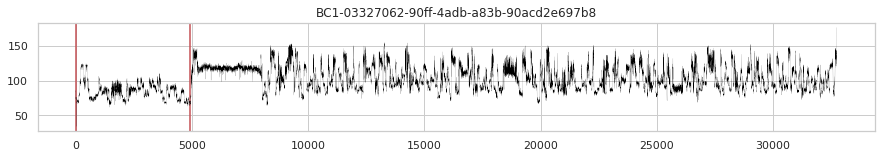

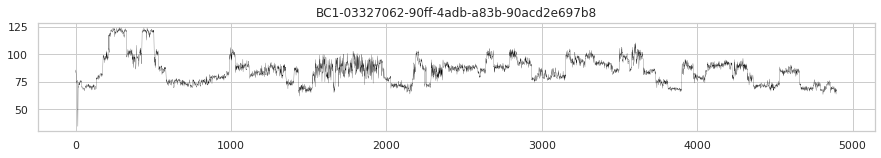

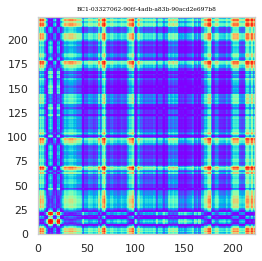

Reading: 036c91fd-a626-47f8-979e-52317f7d2d1a


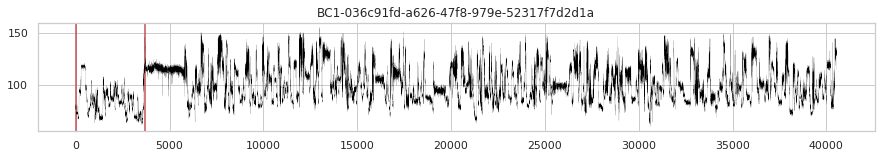

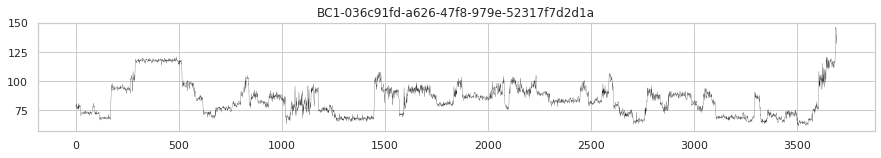

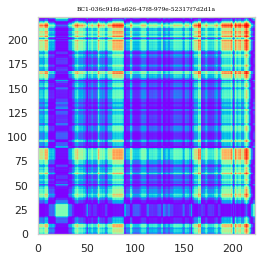

Reading: 047d6e78-9237-4acb-bfa4-6e17df56f467


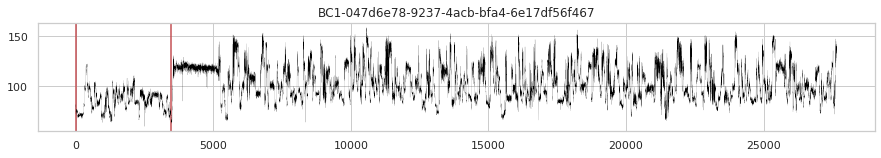

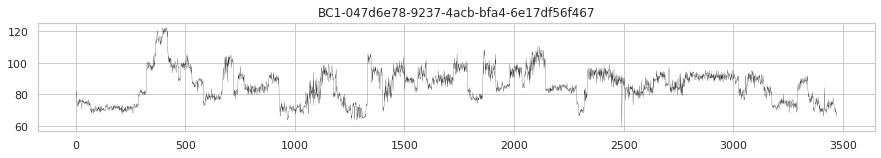

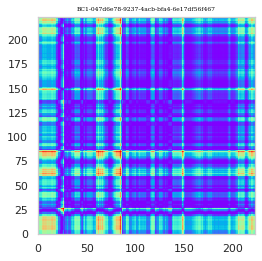

Reading: 049941a1-2d8c-49ec-8a46-36909f3c37e0


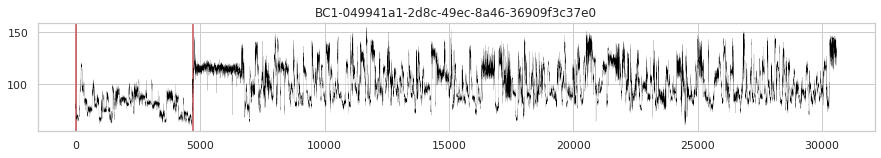

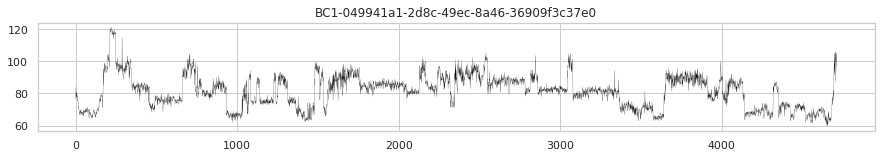

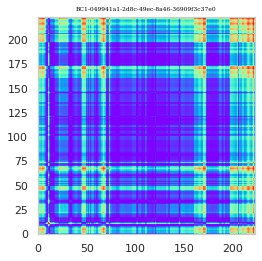

Reading: 04c49e39-5517-4c81-988a-76e45841d0b1


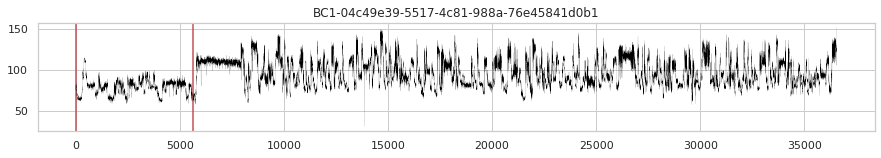

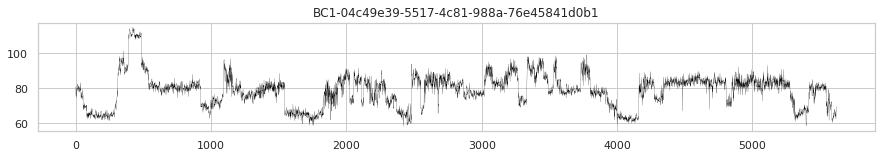

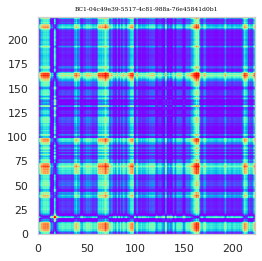

Reading: 05c441d9-29bf-4e0d-b04e-36464c61d95b


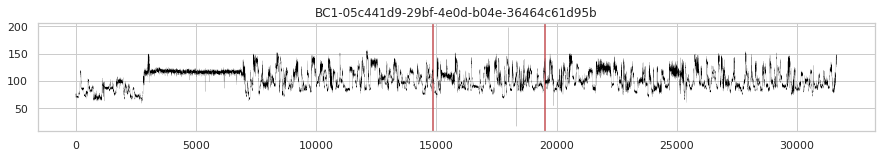

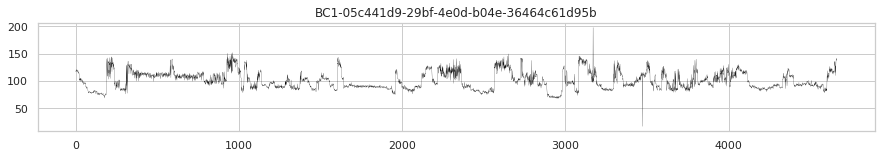

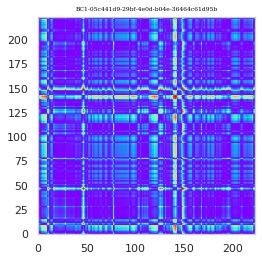

Reading: 05f60003-09d6-4a45-9bef-a8e1920a65a1


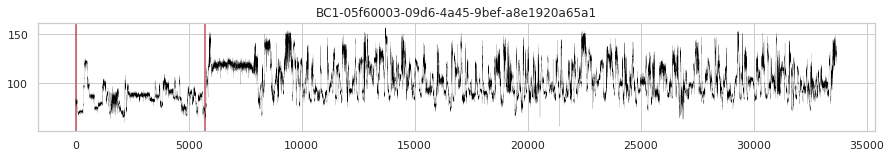

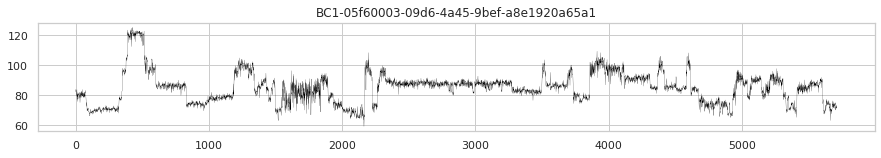

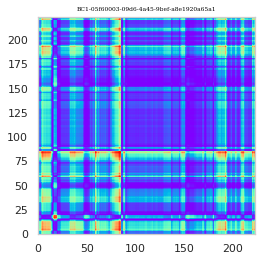

Reading: 06417b11-3b84-46f4-81d1-e82401262911


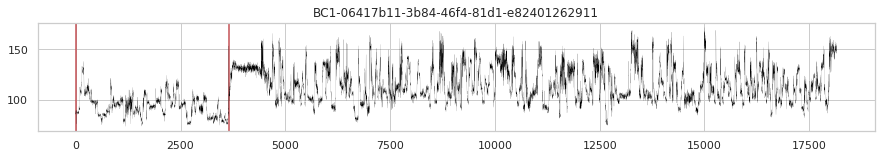

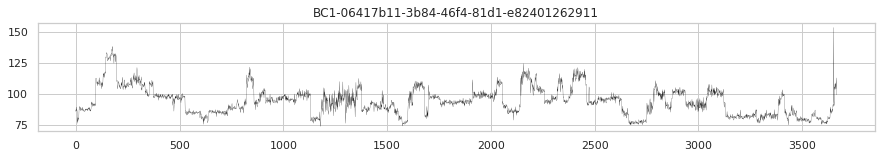

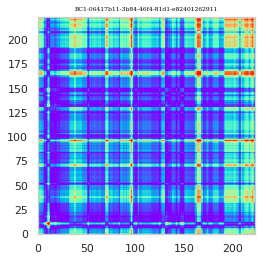

Reading: 06ed4c98-57df-446e-a4a6-8f3e8790a66e


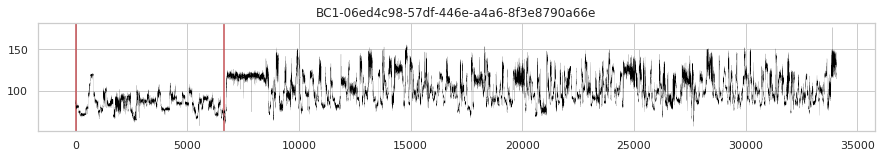

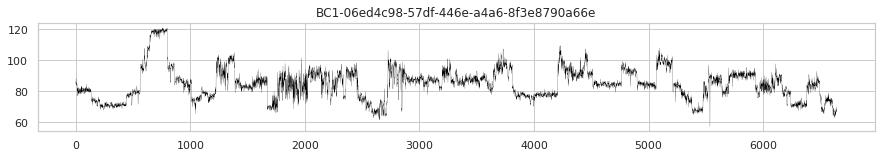

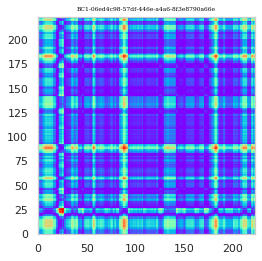

Reading: 071a1ee0-439d-4158-bca1-081d7c6b280d


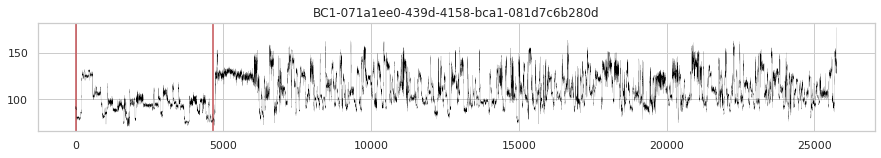

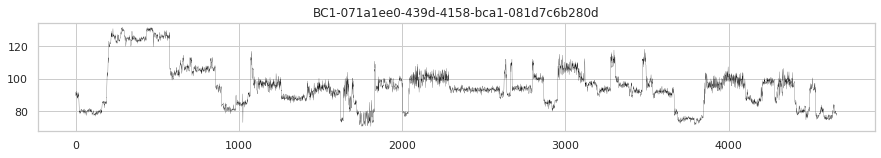

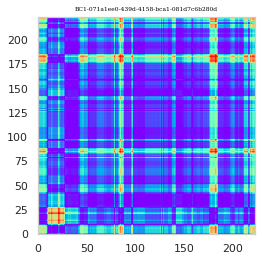

Reading: 082c0443-ee13-4fe3-97b3-af798ee1038e


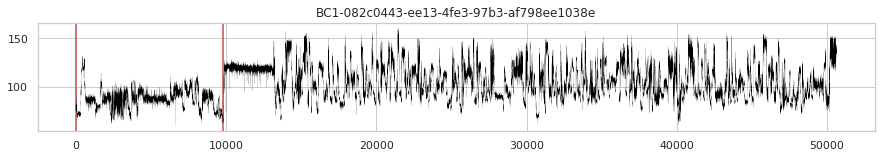

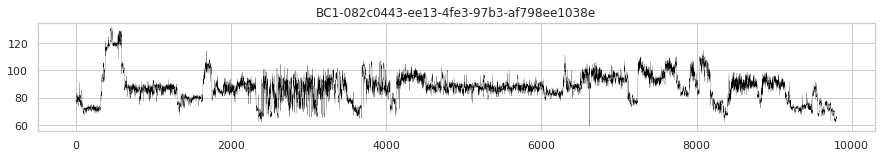

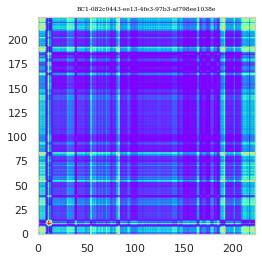

Reading: 086115c0-ed44-4905-a80c-b76974f558ac


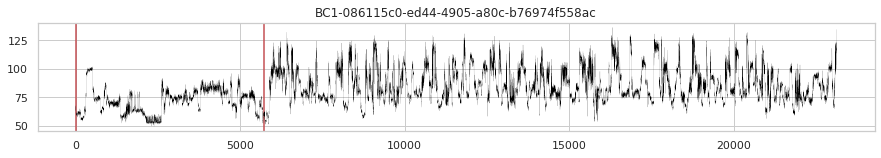

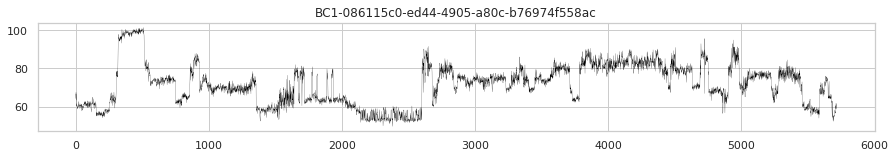

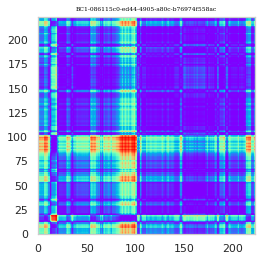

Reading: 0926bf72-7fc6-48f9-a127-90aea0f1fdf0


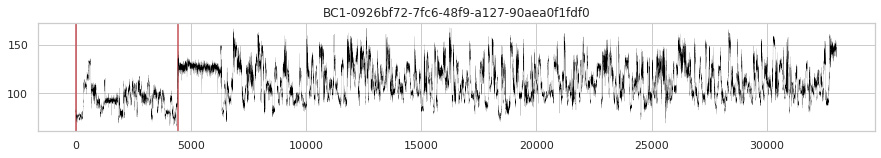

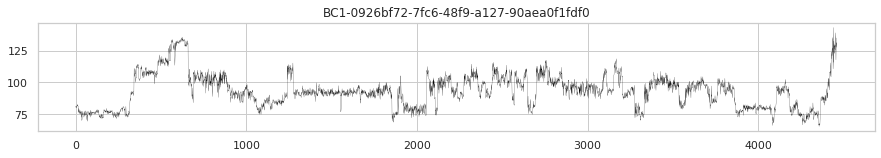

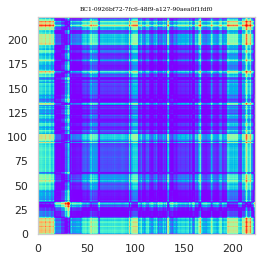

Reading: 09a42296-877b-44c9-a2bd-e8bf4c7c3215


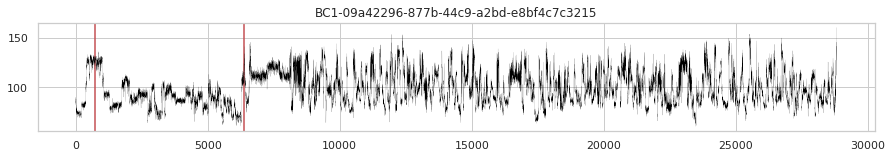

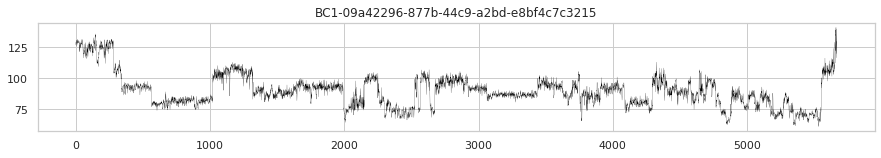

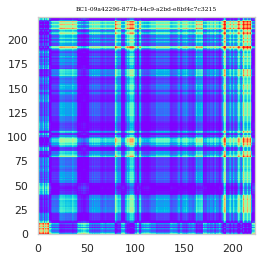

Reading: 09aae799-42d9-4e44-a6fd-79bba63c6273


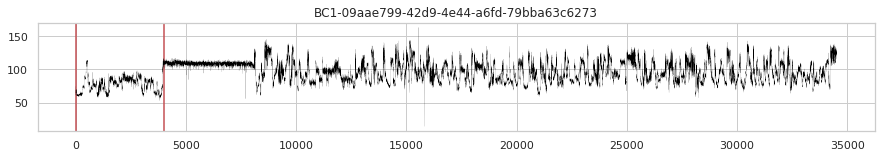

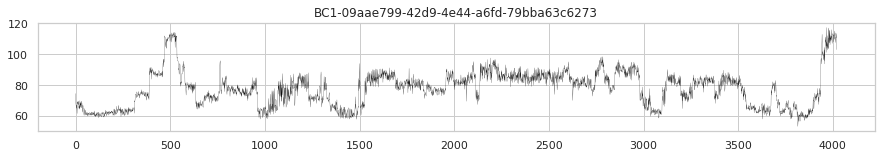

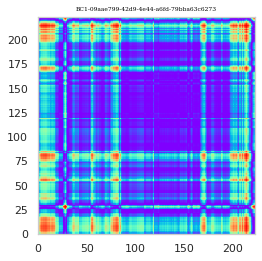

Reading: 09ee15a5-d2e0-402b-9854-3577a4d1772a


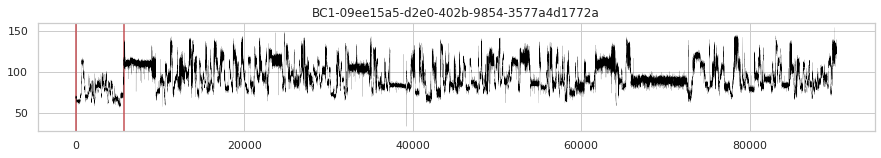

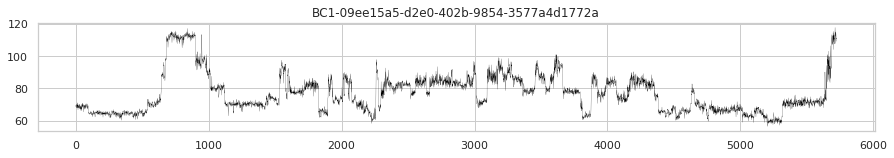

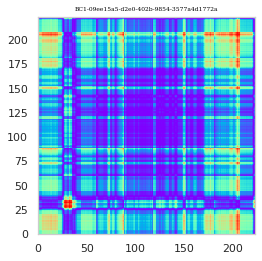

Reading: 09fd4860-1bc6-4ad3-ab9c-04146edfd039


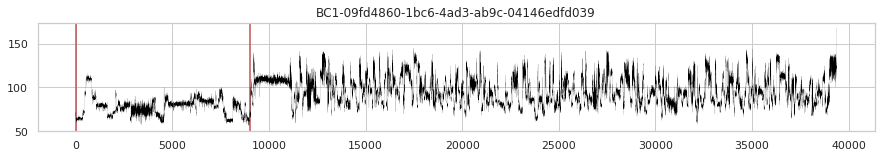

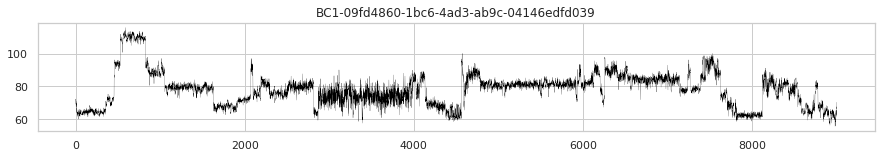

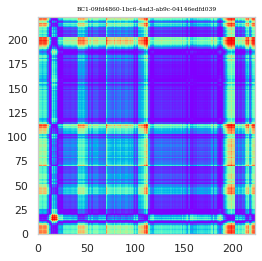

Reading: 0a80b4c8-6284-43ee-9e7e-048291b41283


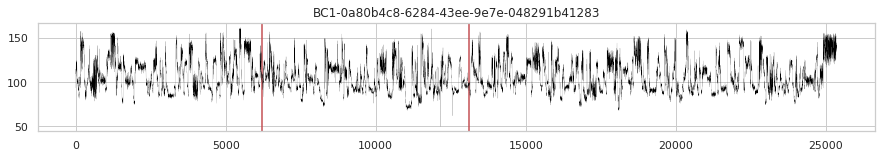

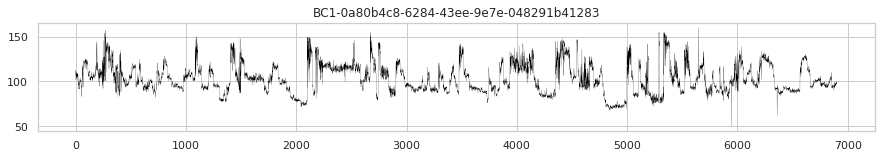

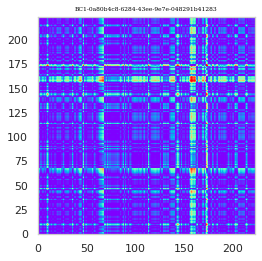

Reading: 0a9ac5e1-c2b4-4a8c-adef-86766e01a0c0


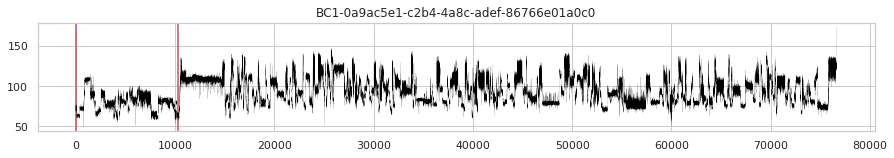

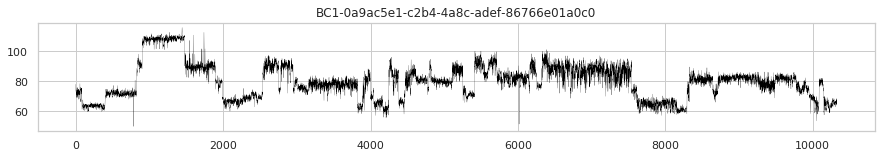

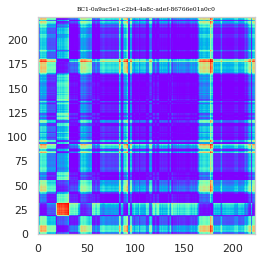

Reading: 0b991407-31a8-468b-9ca5-ff7effdfc538


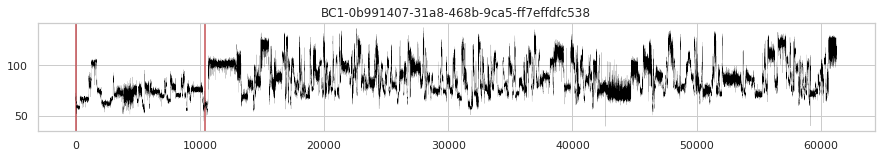

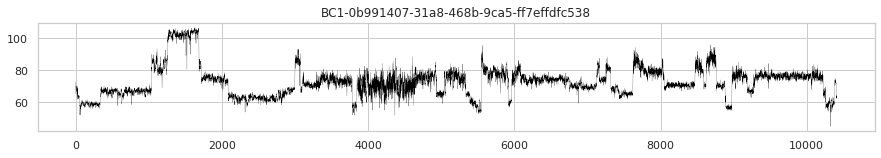

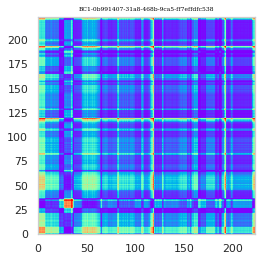

Number of Squiggles= 43994
557.9378492832184  seconds
BC1 = 43994 samples now
File name= /data/nanopore/James/Barcodes/rep3/BC3-R1_103.txt_squiggle.tsv
Processing file: BC3-R1_103.txt_squiggle.tsv
Reading: 060d2cec-479b-4b65-a0aa-e96e48152a50


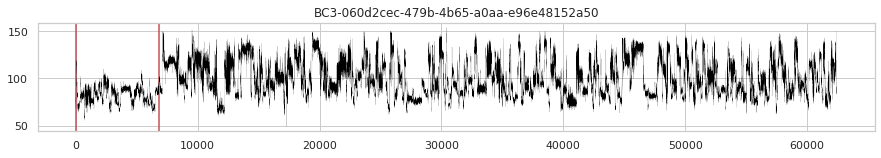

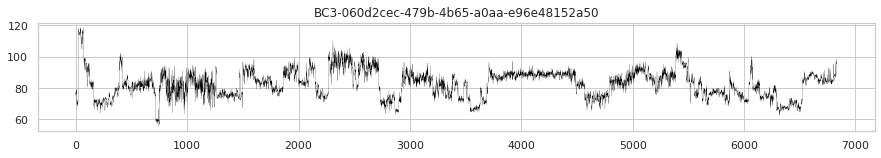

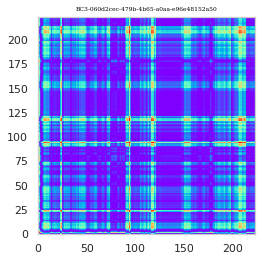

Reading: 07682178-2a81-4d94-b27f-96df4d5c26e5


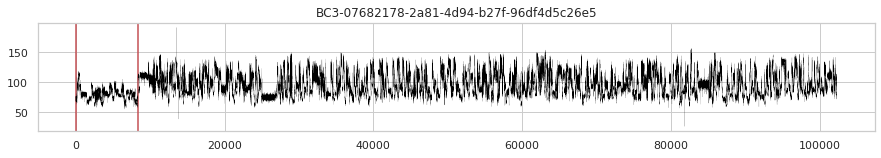

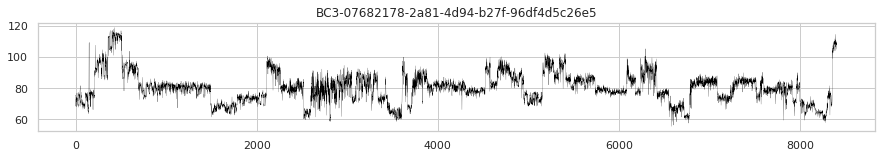

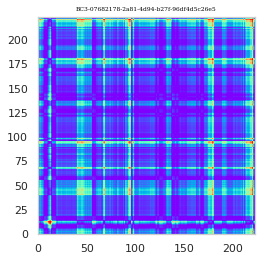

Reading: 0c9ab90c-6dac-4eb3-8a96-5e7093ba5d3e


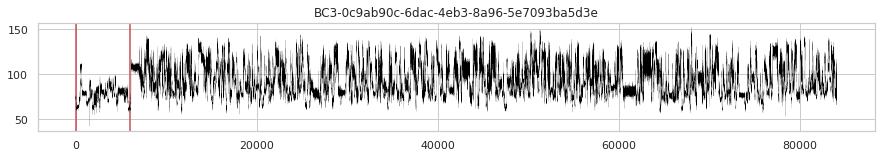

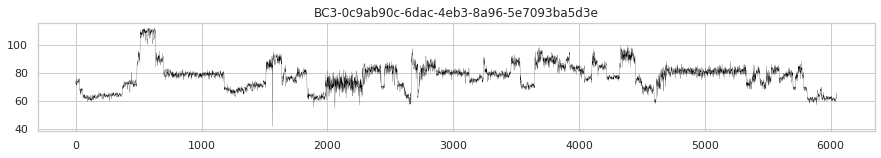

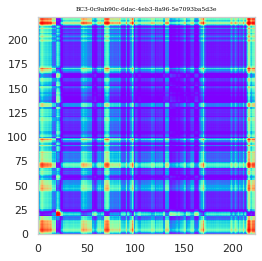

Reading: 0ed6a82a-9048-453b-b607-6388309442e9


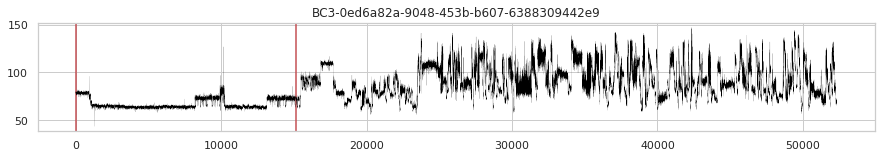

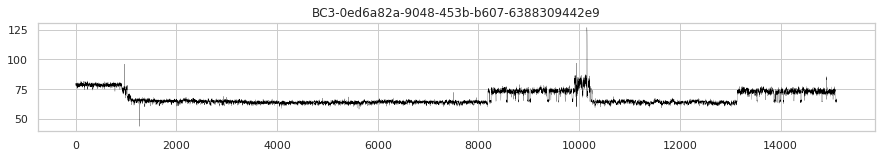

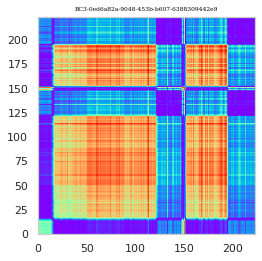

Reading: 10148d57-13e7-42b9-ae1e-b0941e1b0a2e


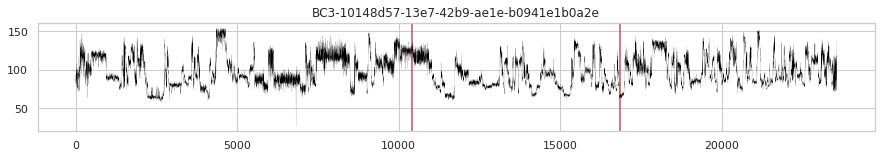

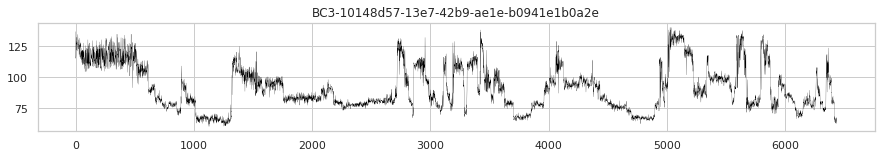

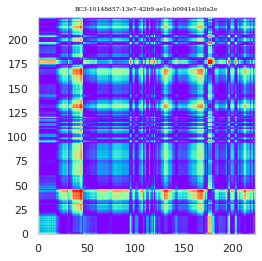

Reading: 129a6de0-13e6-4c98-a694-b94725790689


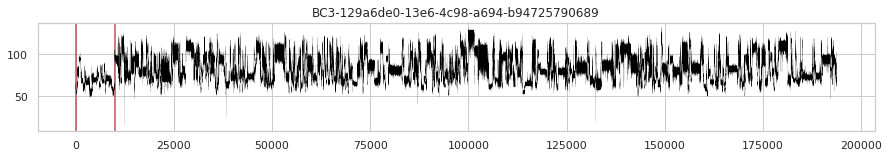

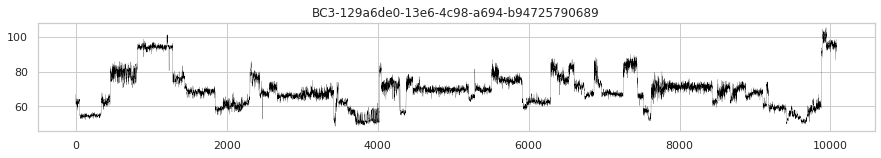

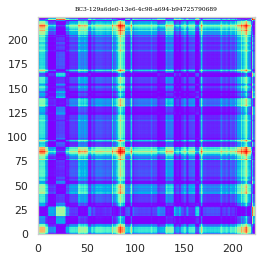

Reading: 17dc9f5b-d93c-4591-8065-802f324d9f0b


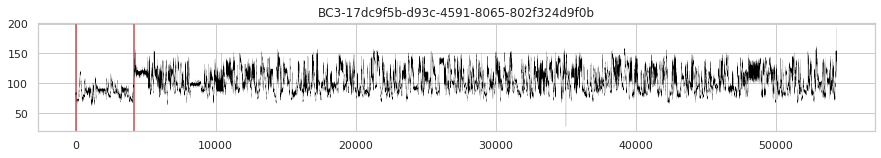

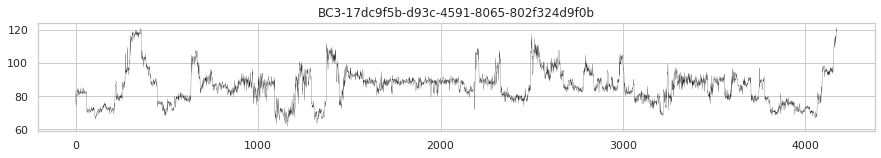

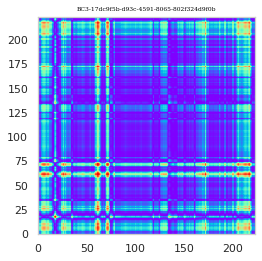

Reading: 1c06c6a0-6948-4871-92f6-d270fe49c84c


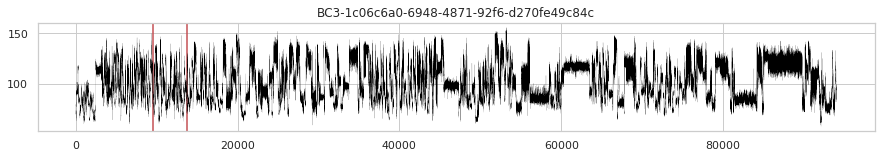

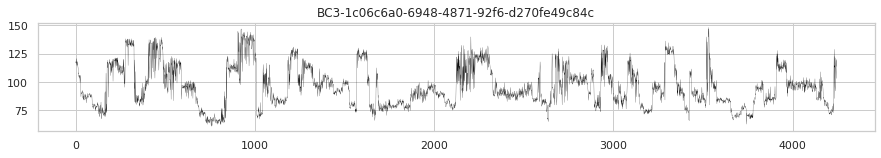

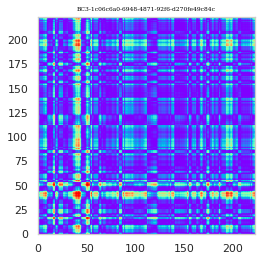

Reading: 1cc6e8b4-1bad-4ffa-9485-2e686b088e0d


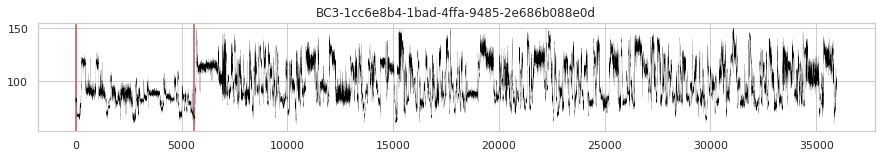

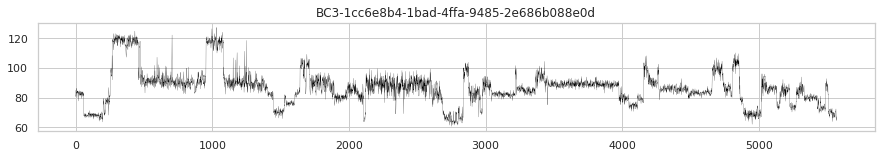

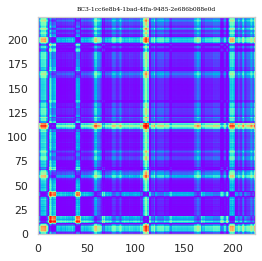

Reading: 1f738fb3-1cb2-44f6-8a9b-9b4b273dc37f


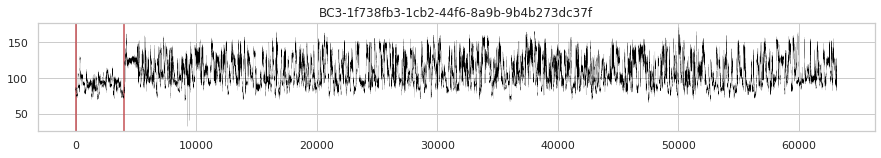

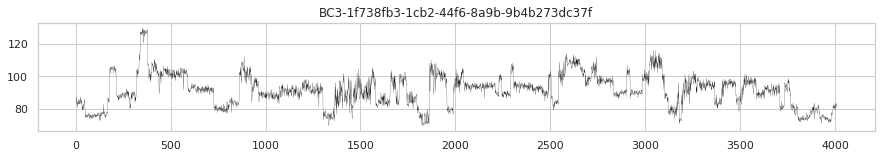

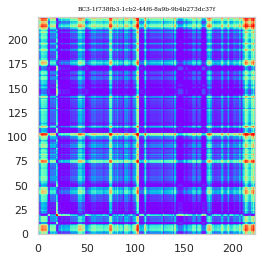

Reading: 24d15571-55ca-49bb-969b-88871e54c842


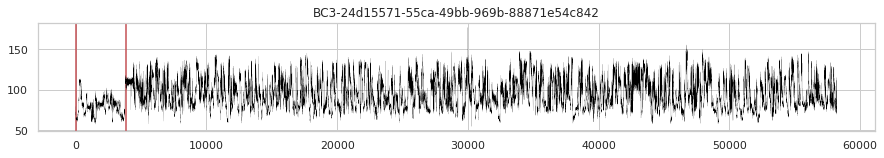

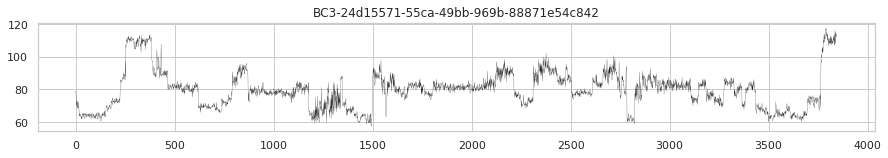

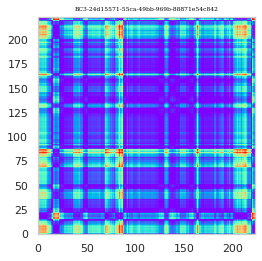

Reading: 265a6bc2-81fb-44bb-9f7a-7fea082e3b93


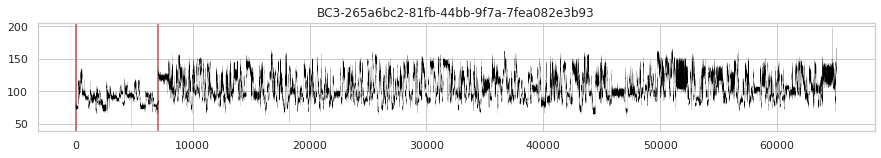

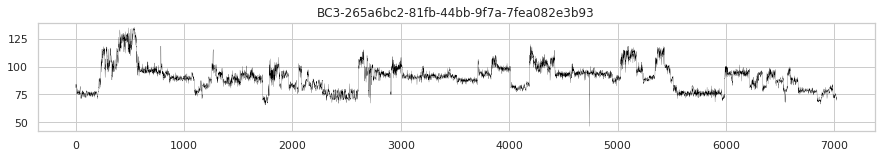

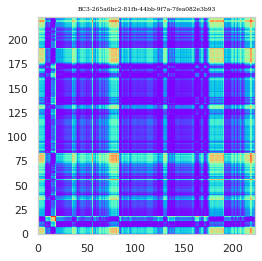

Reading: 299ccba8-476b-46ba-a0f0-cb863c64c7fc


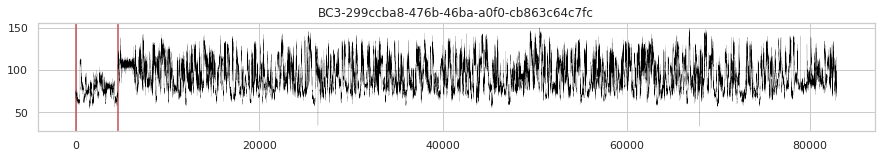

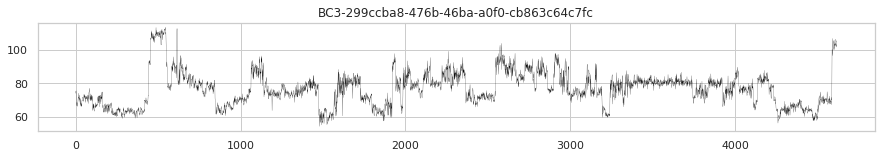

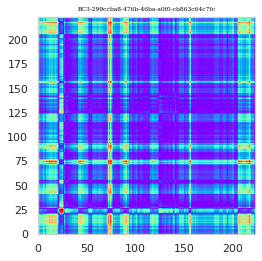

Reading: 2a68839f-aa10-44b6-ae56-e5e9872491c4


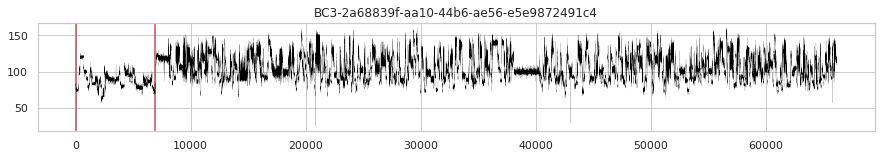

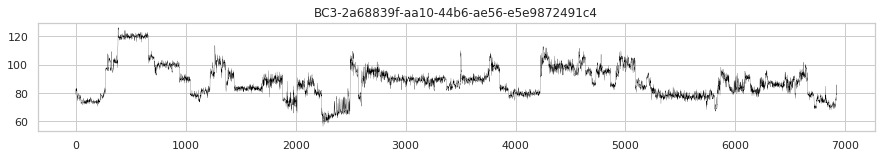

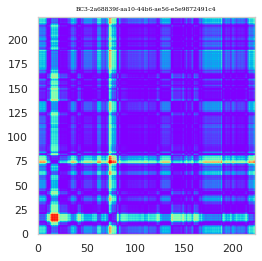

Reading: 2bcfac12-819f-492b-b34e-02026de03fc8


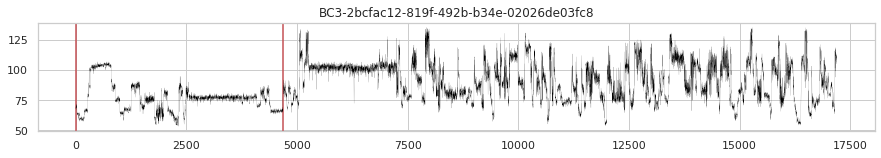

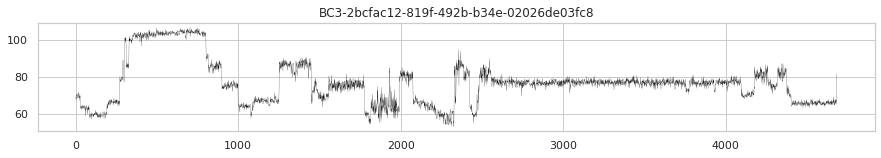

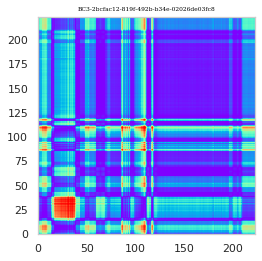

Reading: 2d1a883c-868f-4dd0-985c-ec87397afe8b


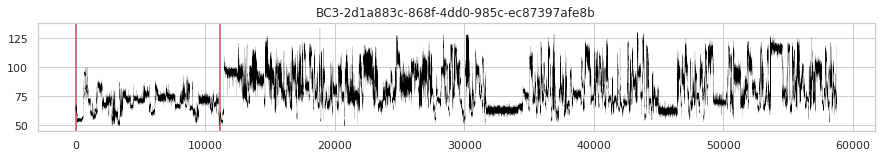

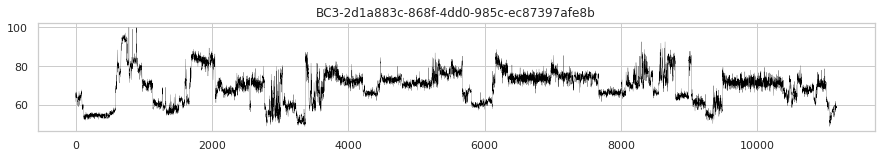

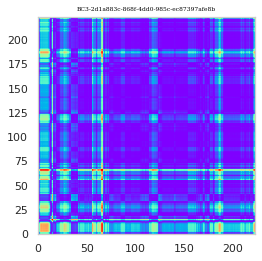

Reading: 3245aead-87c2-4d2e-a52a-da5af819eff8


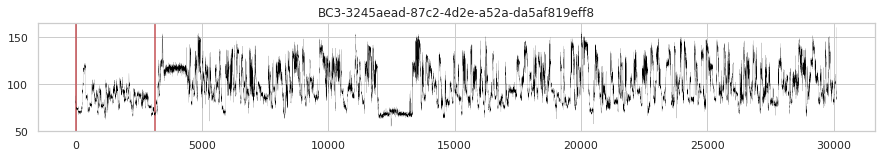

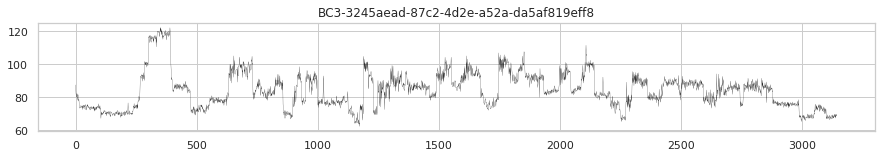

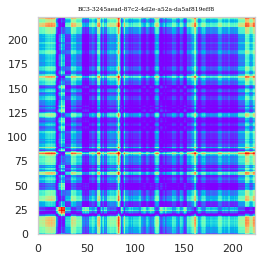

Reading: 327f7086-08fd-4003-8244-4bf24c7fe2fd


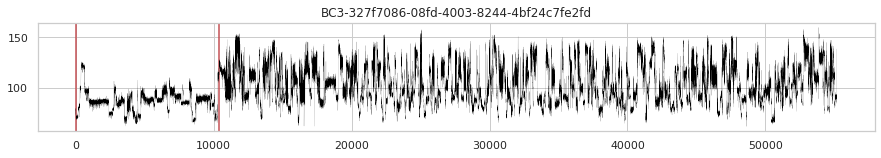

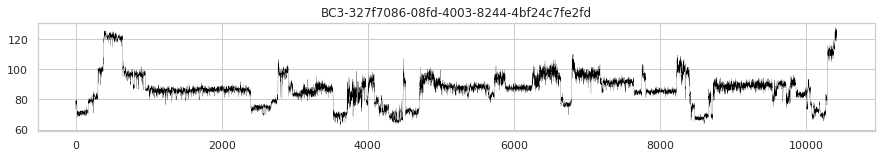

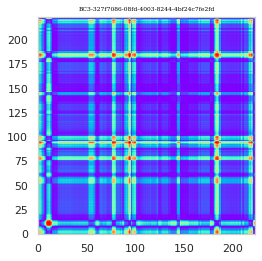

Reading: 35235272-68bf-4195-8b3d-679823bcf6dc


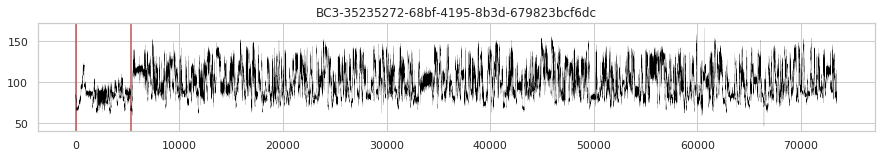

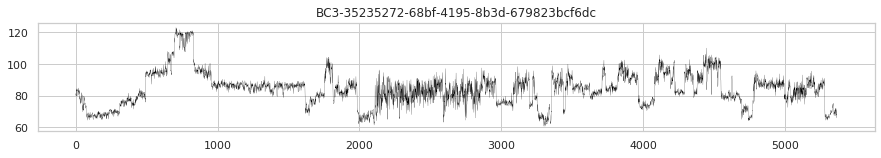

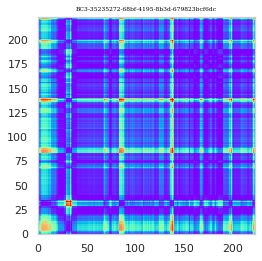

Reading: 35610956-1a9f-4053-8f52-c0650a129b1f


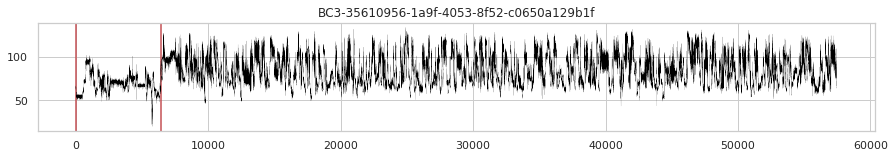

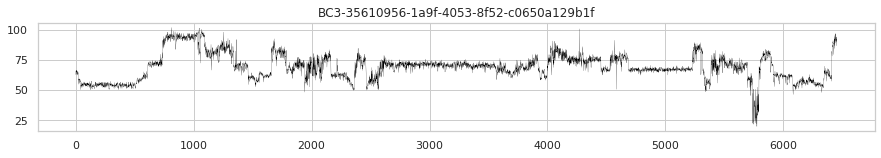

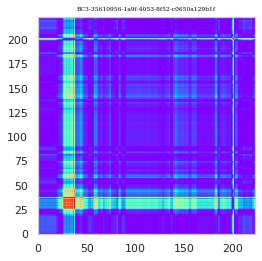

Number of Squiggles= 21129
482.7902433872223  seconds
BC1 = 43994 samples now
BC3 = 21129 samples now
File name= /data/nanopore/James/Barcodes/rep3/BC2-R1_81.txt_squiggle.tsv
Processing file: BC2-R1_81.txt_squiggle.tsv
Reading: 012e8cb7-401c-41ea-b4a6-4c4bc2a5c6bf


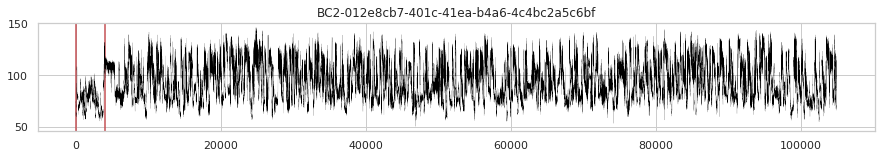

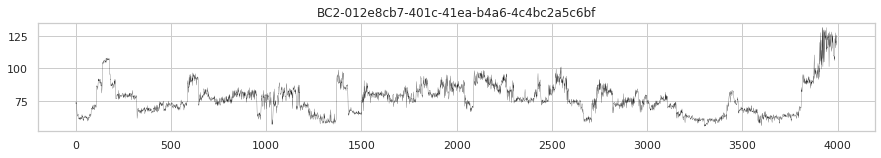

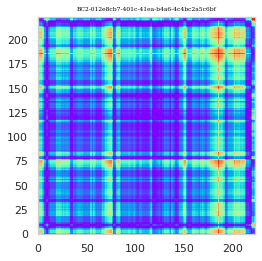

Reading: 02931e98-1804-4d5e-816e-693f6e00b293


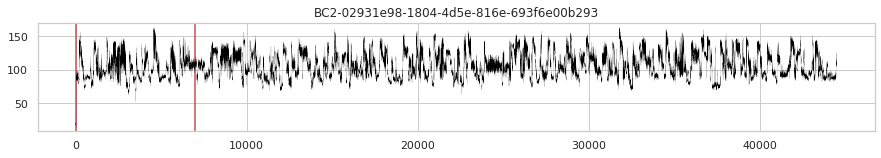

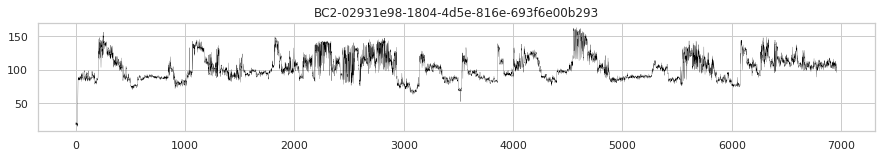

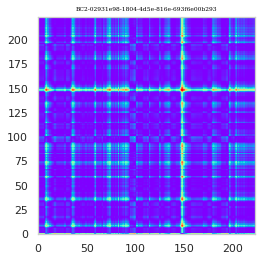

Reading: 057c3f68-a072-4141-9000-969a89fc341c


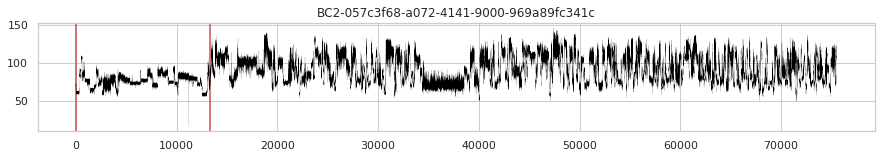

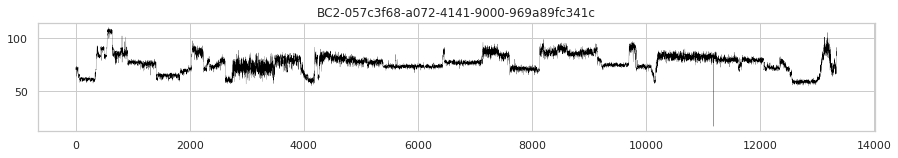

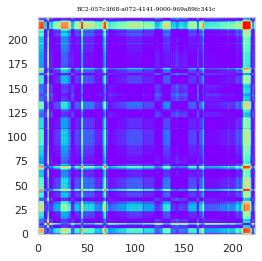

Reading: 05e53180-84c8-4aee-a6d3-fbb50e33f033


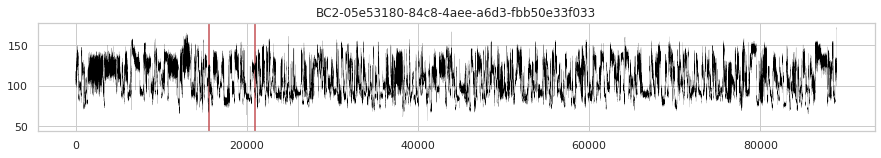

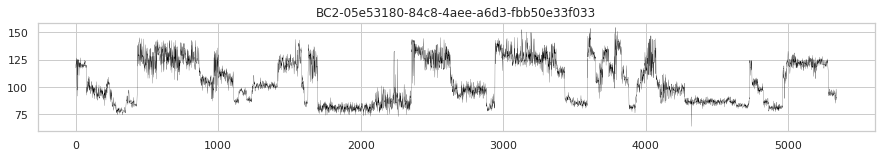

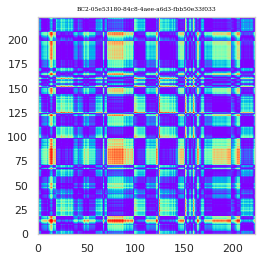

Reading: 05ecc114-f352-4f06-8fd5-c2c21faa175b


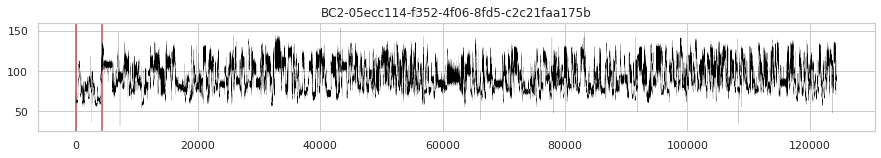

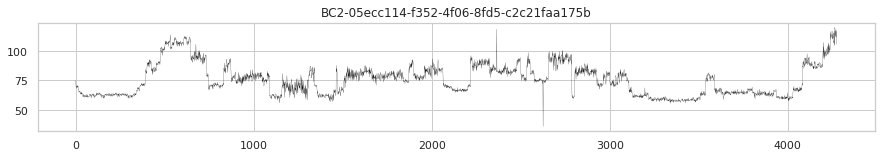

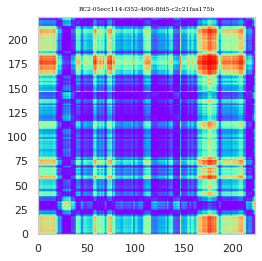

Reading: 088705fc-8e68-4d7e-87fe-73a73ff45a20


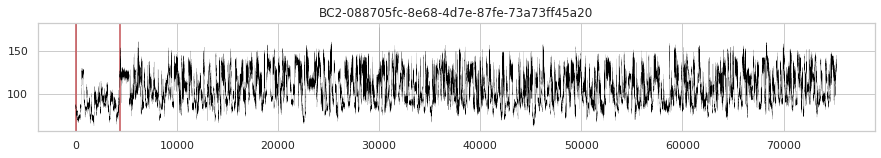

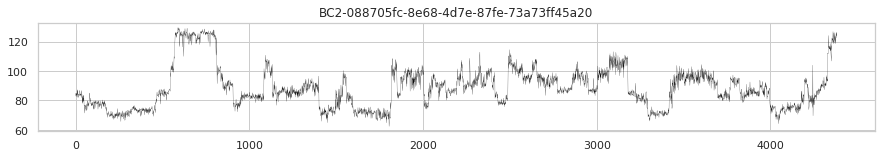

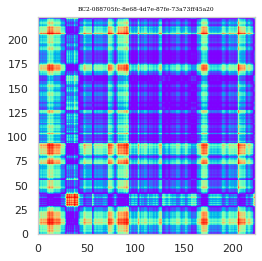

Reading: 09200812-2387-4a58-8719-7ec6ae672173


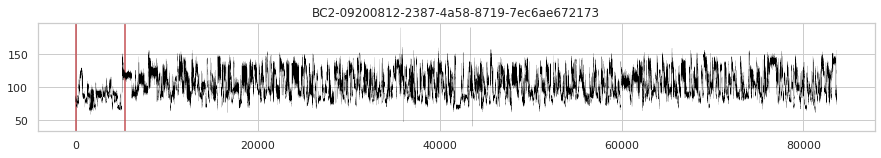

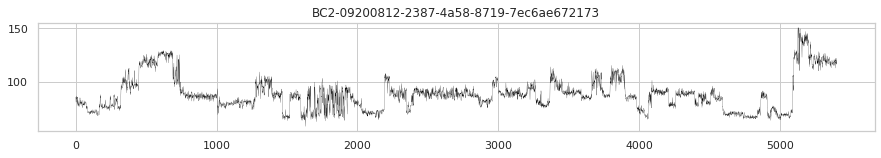

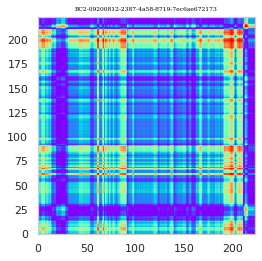

Reading: 0dac7d8a-4894-4952-b8ae-9128b31c4acc


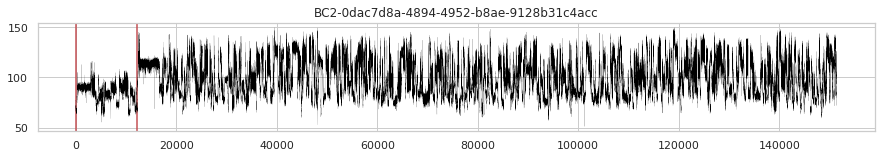

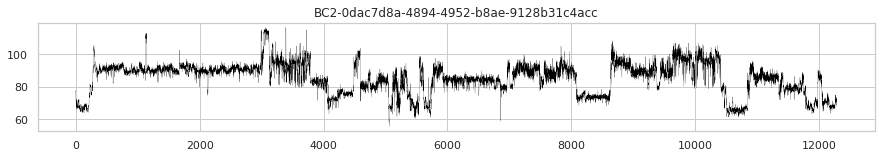

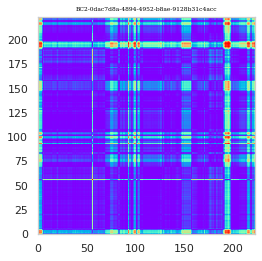

Reading: 0dc1fb2e-dc33-4312-9de2-964ccf43d36e


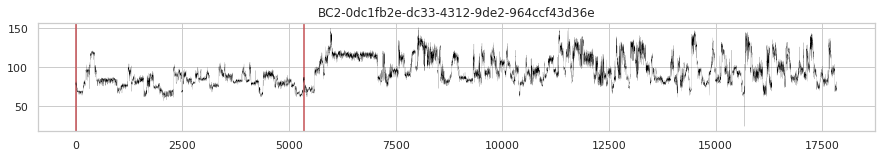

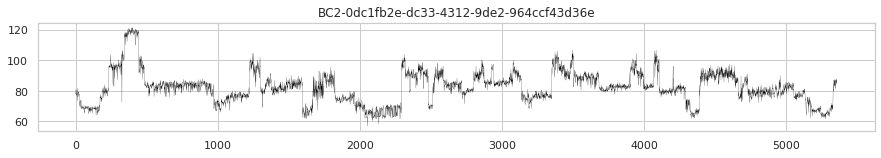

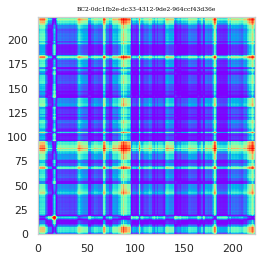

Reading: 0efe000c-be93-4e9f-82a5-e5c2666adc25


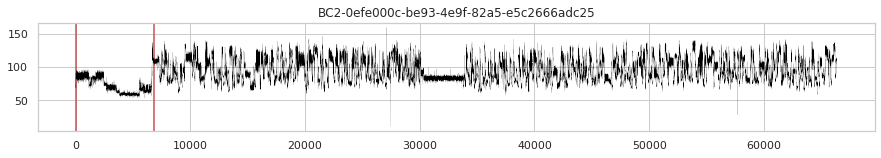

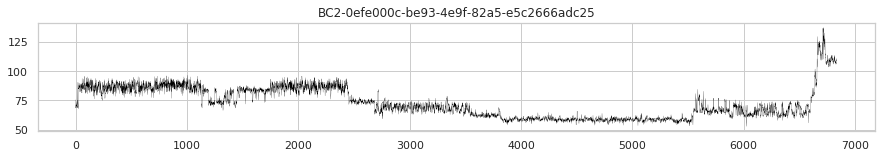

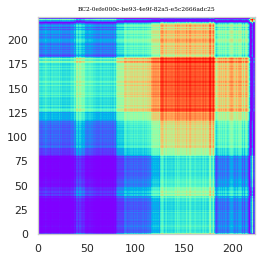

Reading: 1195e5cd-7b87-46f8-9756-8b0e5590f9c5


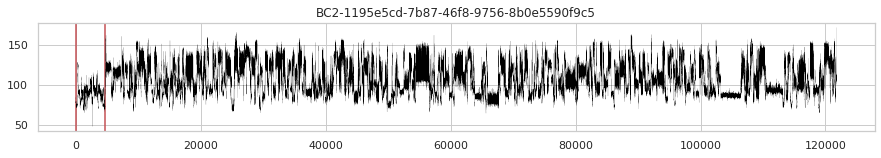

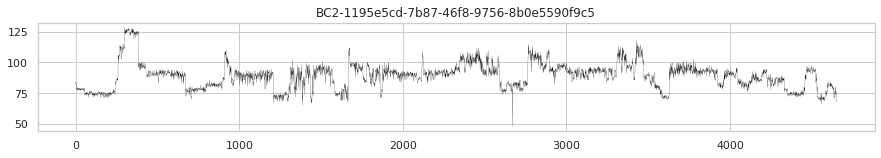

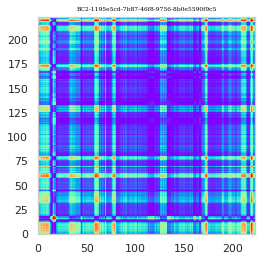

Reading: 1264de4d-9424-406b-9f88-8af70e7a4f1e


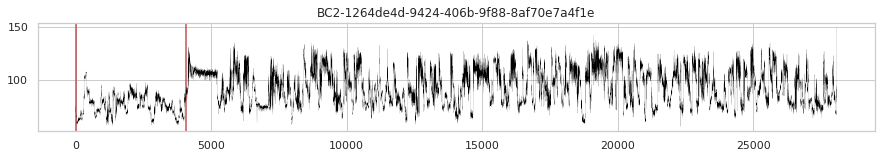

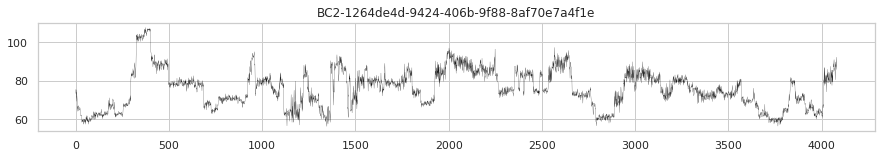

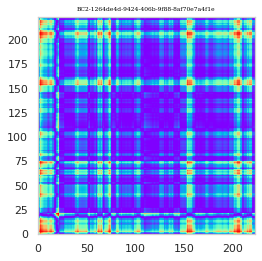

Reading: 1358ee1a-a89d-4303-a3c5-9415a6562654


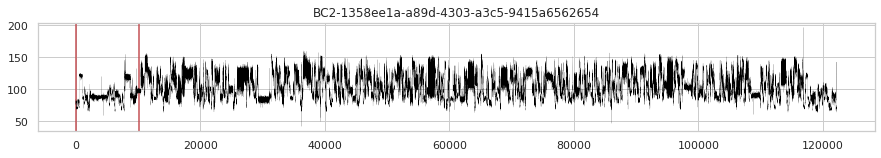

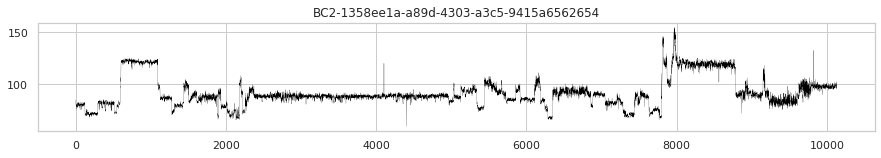

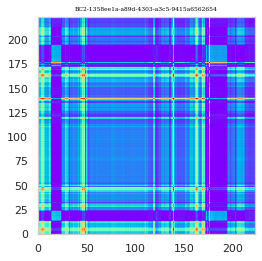

Reading: 1792b6e6-7be8-4ec3-b61d-68f675e3e599


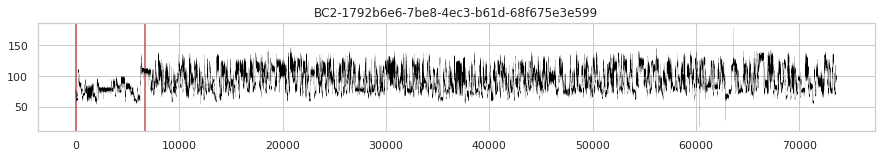

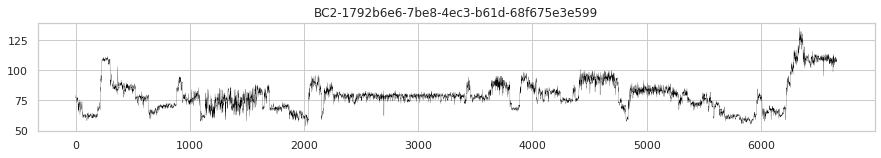

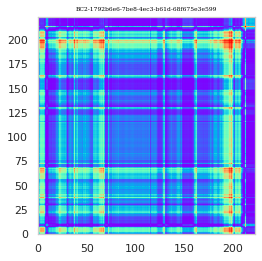

Reading: 19924c55-2be0-47aa-b284-85ad11fd3059


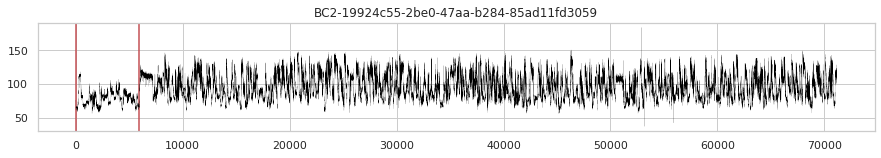

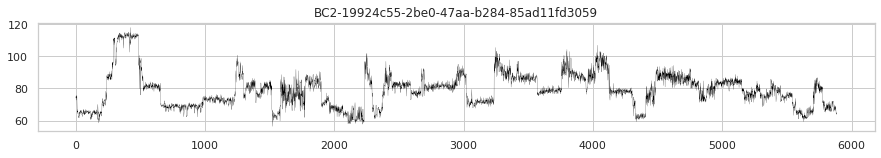

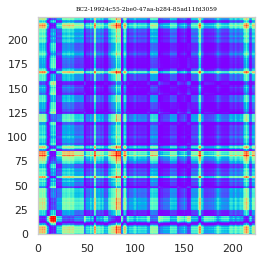

Reading: 19d3dbbf-3a71-47cb-9031-40dc85f7dd1d


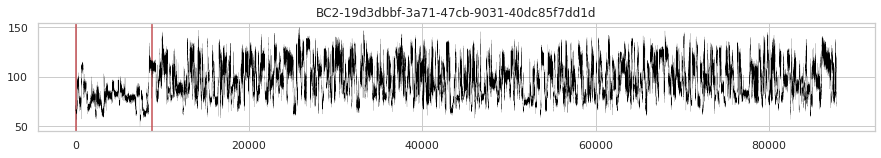

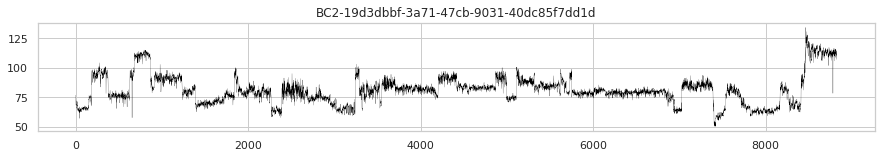

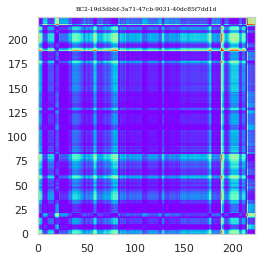

Reading: 1e954f75-47f3-4557-af25-aa17dce6c0d2


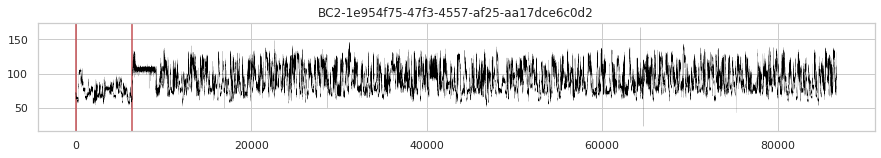

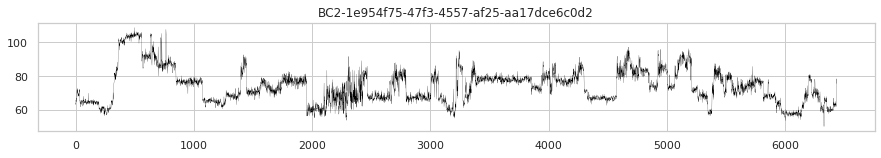

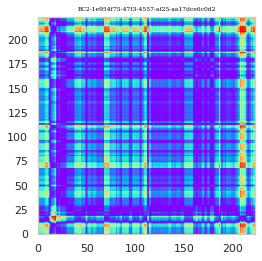

Reading: 1f9a16e6-7a37-4cb4-a4e2-696f99032b0d


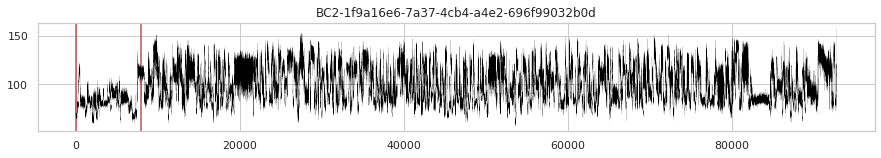

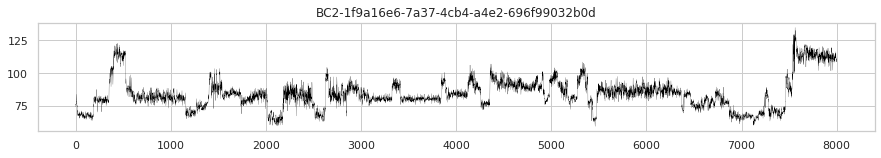

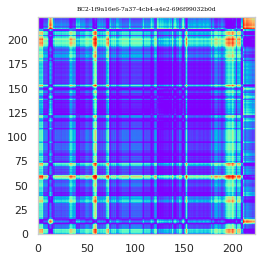

Reading: 2098e7b0-6cc3-45a9-b7d3-da383fb8ba4c


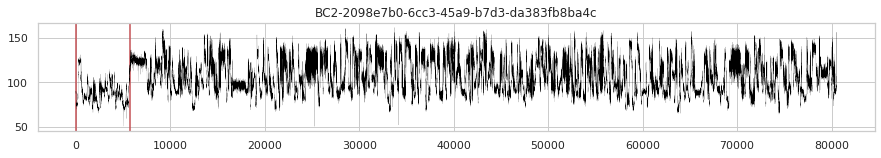

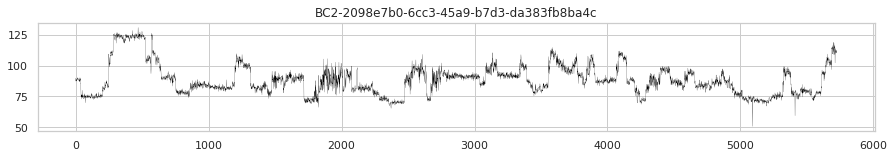

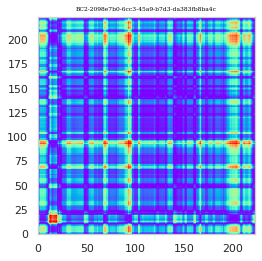

Reading: 221da07d-885b-4aca-afa1-eb4a12a9eec1


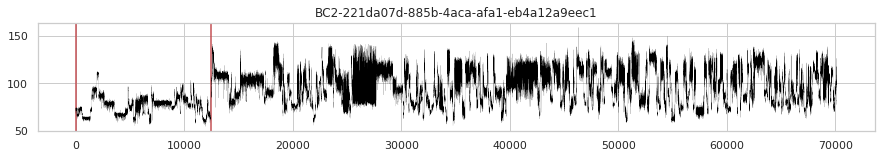

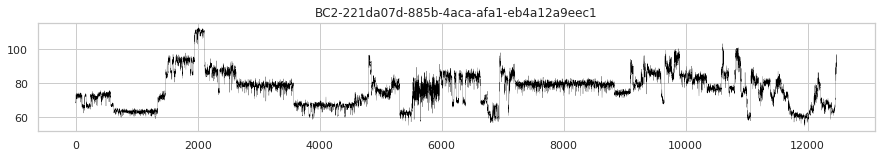

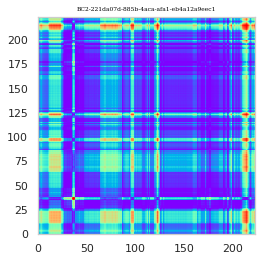

Number of Squiggles= 22271
566.7131373882294  seconds
BC1 = 43994 samples now
BC3 = 21129 samples now
BC2 = 22271 samples now
File name= /data/nanopore/James/Barcodes/rep3/BC4-R1_117.txt_squiggle.tsv
Processing file: BC4-R1_117.txt_squiggle.tsv
Reading: 00c40348-e645-4b2f-8e4e-e2649ce3b367


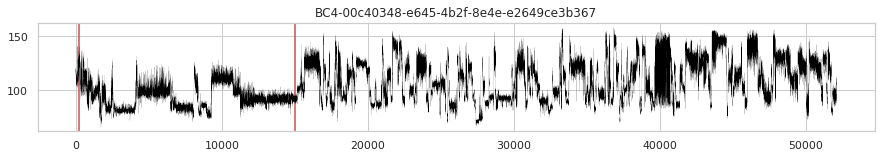

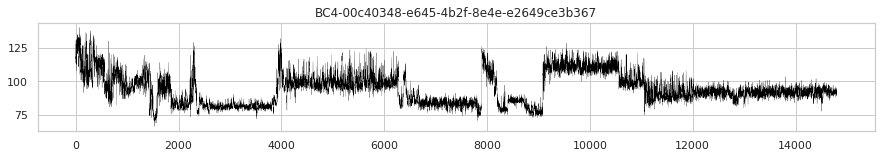

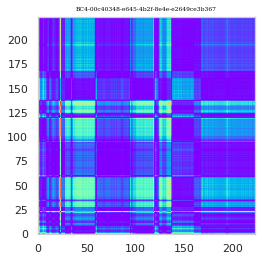

Reading: 037c3de4-0f20-46d3-82f4-bd8741ebffeb


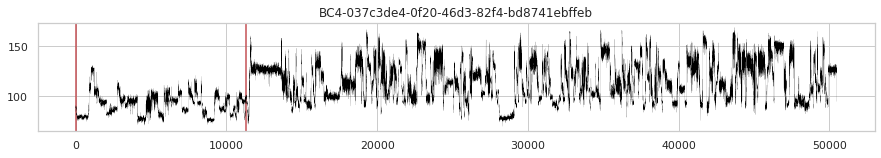

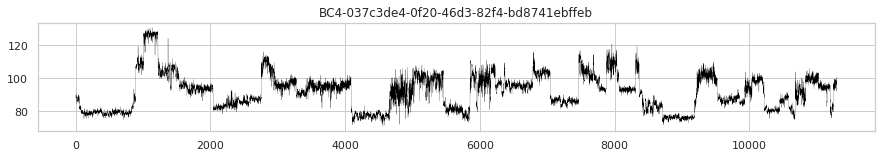

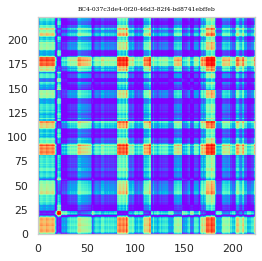

Reading: 03983867-a4e2-44d8-a67e-66f38986c0e8


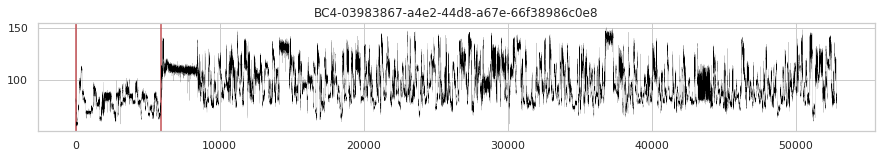

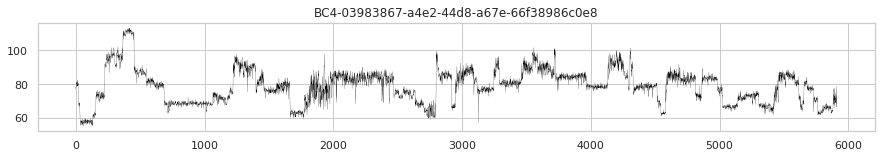

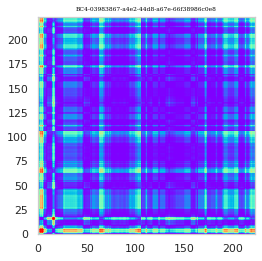

Reading: 041453da-1206-498f-8819-a87bbd4aa20c


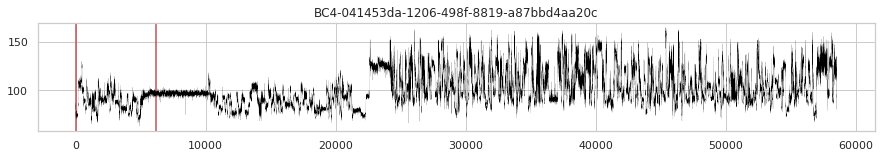

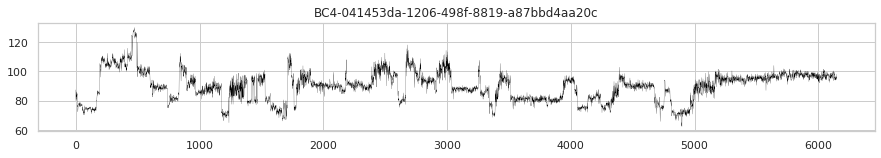

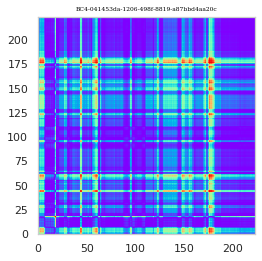

Reading: 05dd8f4c-a1d5-4f65-9f48-40e8b0427206


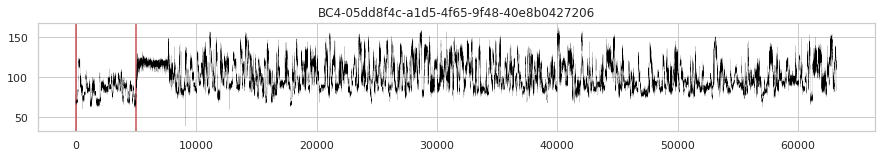

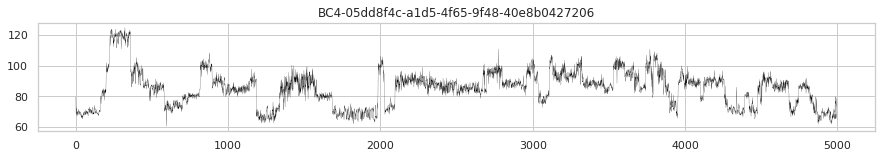

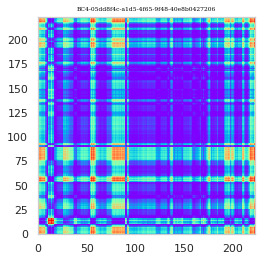

Reading: 05fce47e-d837-46a7-a448-6f6fcbd6867f


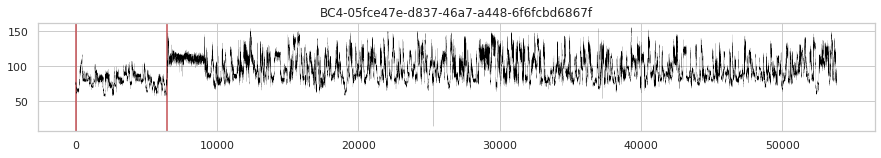

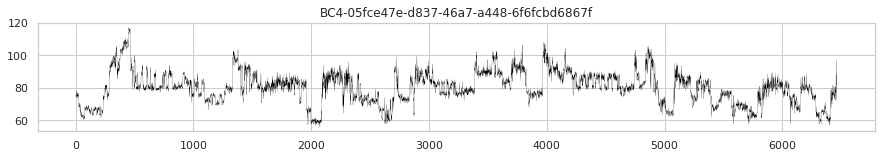

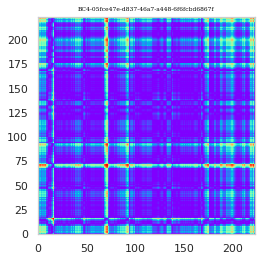

Reading: 077cdfe2-9e16-4660-81f1-47980848cb70


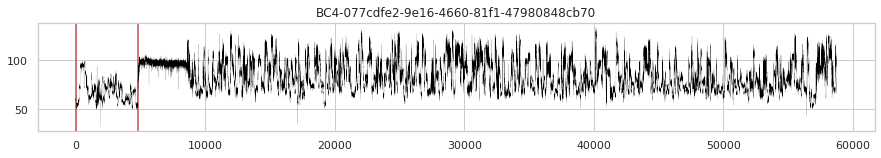

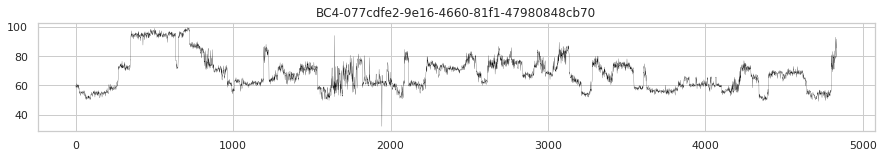

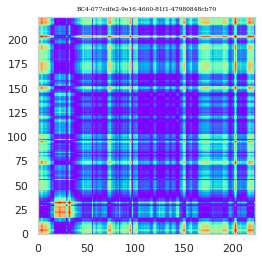

Reading: 09ba46ce-a087-4791-91ef-e1ab90779ddd


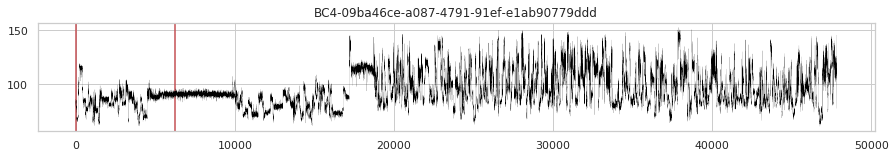

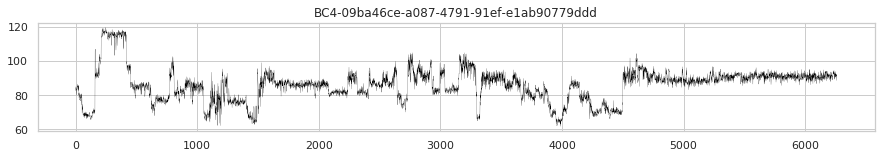

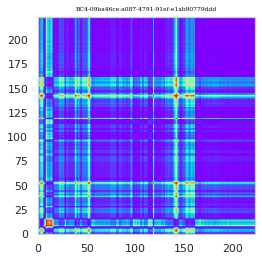

Reading: 0a93eb26-ff6b-46f2-be0b-53a96cfb0661


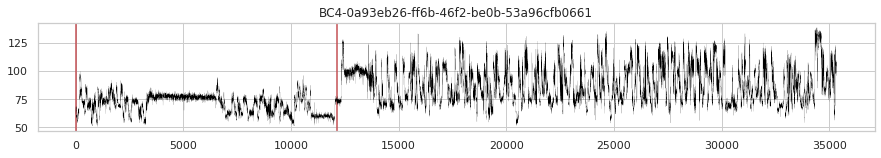

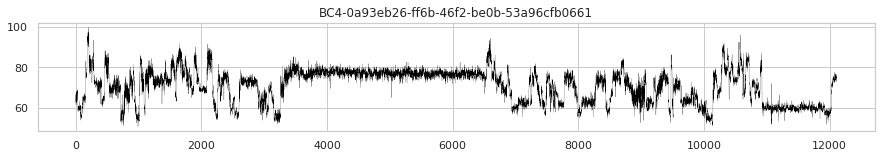

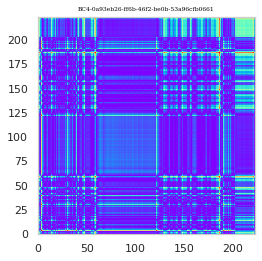

Reading: 0e93c226-a585-4b27-a076-70ebc0447b3b


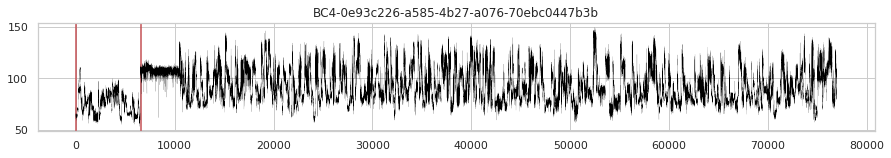

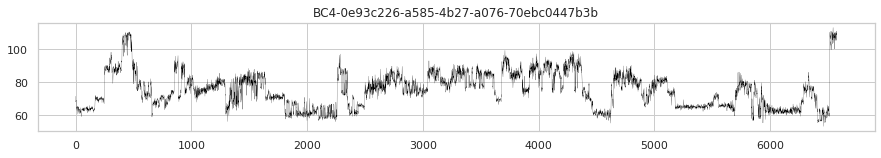

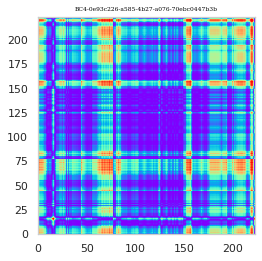

Reading: 0ed5c2bb-7012-46d4-9b23-4dcd57d9171a


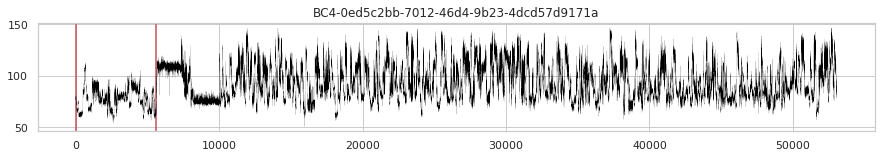

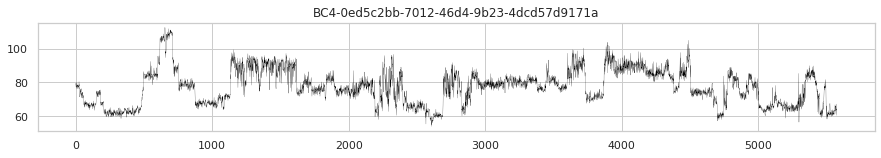

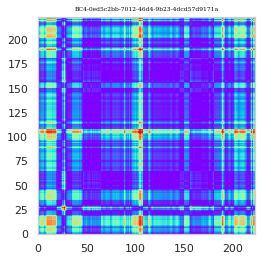

Reading: 1161e127-e54a-48f6-951a-80adbd853754


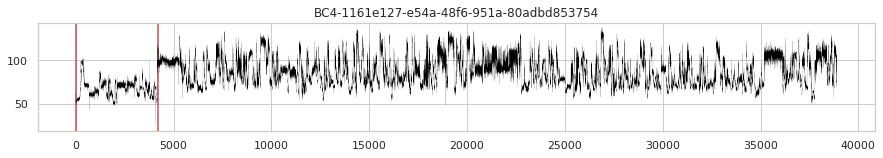

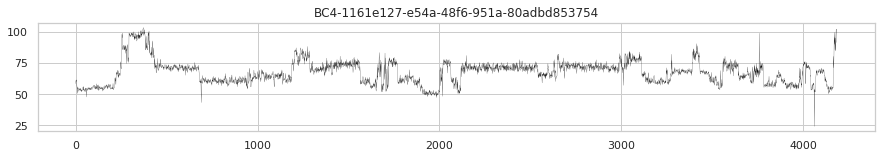

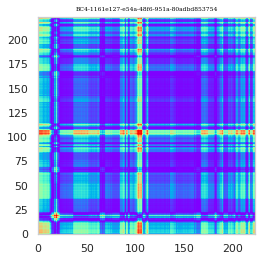

Reading: 122d2f8f-3b16-474d-ba49-82d5530bfa80


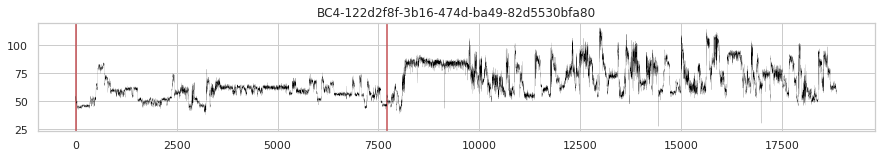

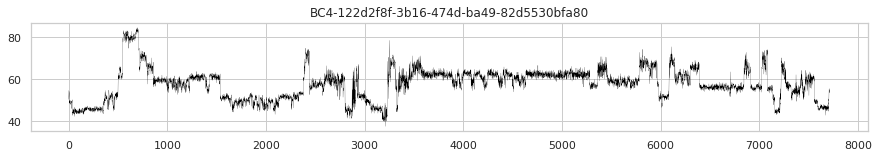

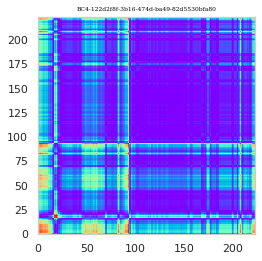

Reading: 12e51a4c-9882-4002-a68c-70793707ef07


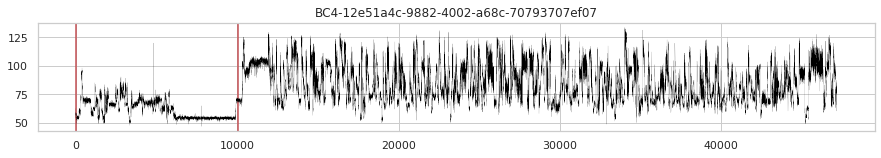

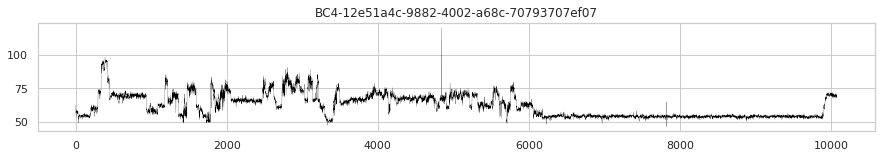

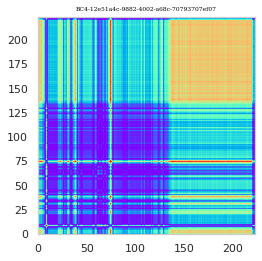

Reading: 130e8546-91a3-4490-9247-f4c60765f854


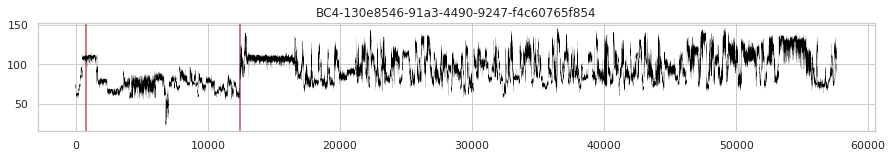

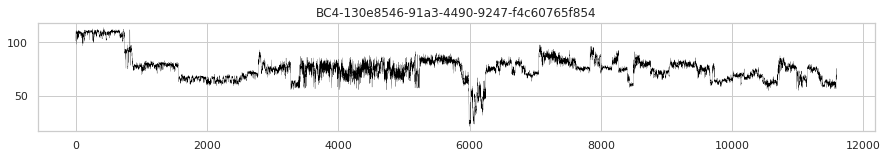

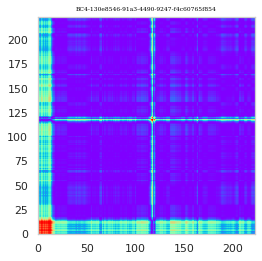

Reading: 132540c0-728d-4a1e-8745-92b202eb7edd


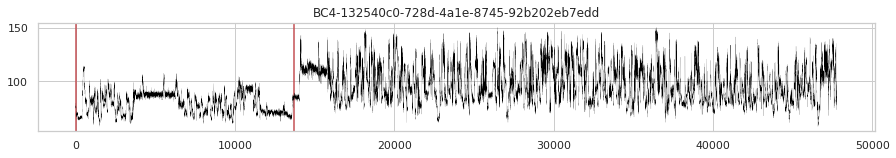

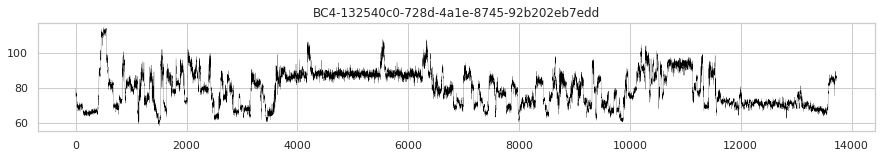

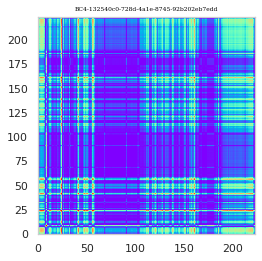

Reading: 133c8a62-ac80-4ff3-a76b-444562c2f9fd


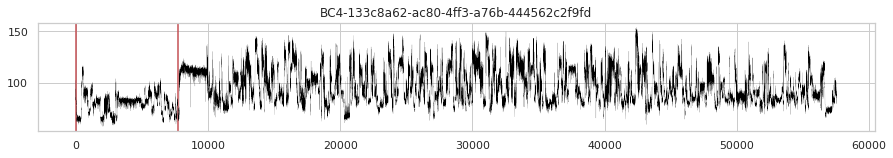

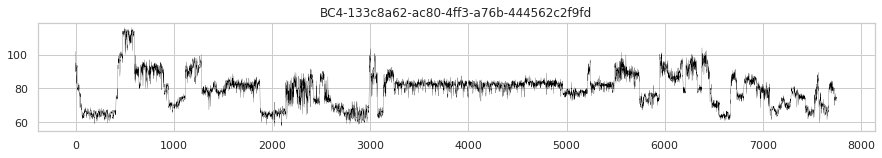

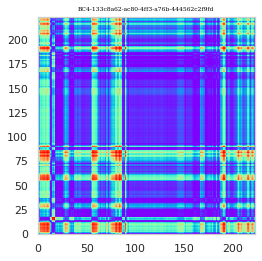

Reading: 13dbebdb-6d8b-40f2-8a8d-66909a912732


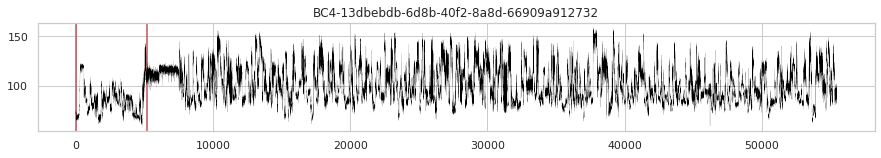

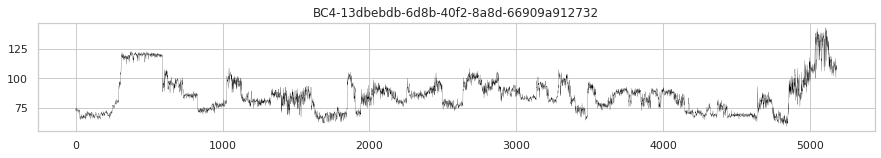

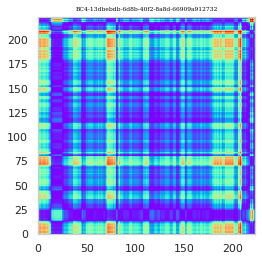

Reading: 1431deb1-a332-4fae-87a4-c39eb66787af


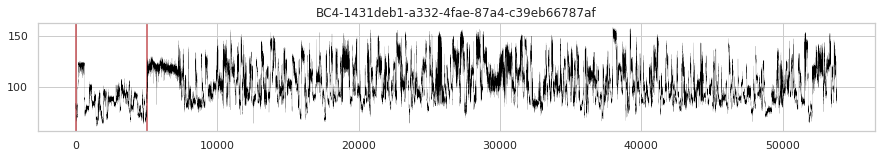

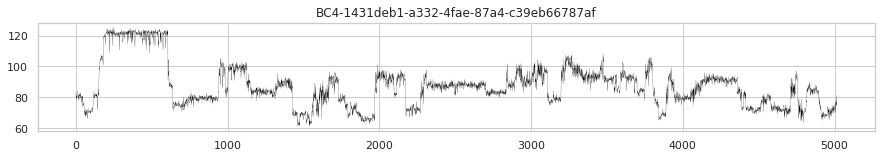

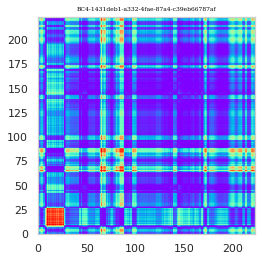

Reading: 1607b602-963e-4f1b-befd-8762956dcd66


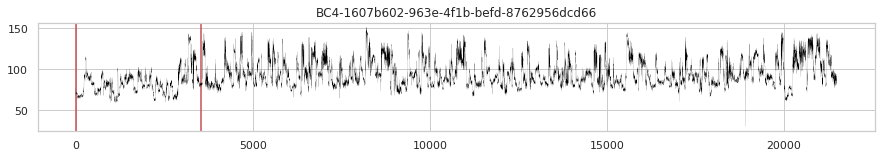

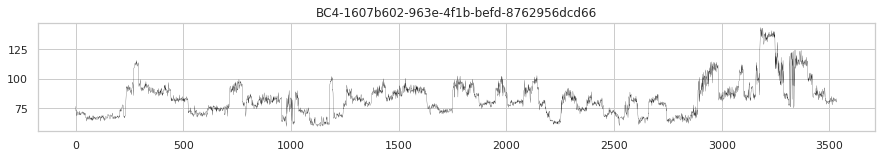

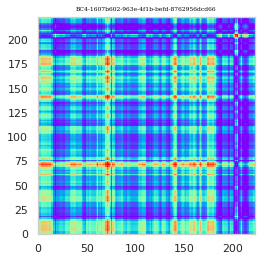

Number of Squiggles= 36780
656.2632281780243  seconds
BC1 = 43994 samples now
BC3 = 21129 samples now
BC2 = 22271 samples now
BC4 = 36780 samples now
CPU times: user 38min 44s, sys: 5min 19s, total: 44min 4s
Wall time: 37min 44s


In [35]:
%%time

result={}
for data_path in input_data_paths:
    print(data_path)
    for fn in all_files_in_path(data_path,'','squiggle.tsv'):
        file_name=data_path+'/'+fn
        print('File name=',file_name)
        summary=process_file(data_path,fn, 5, 10)
        for label, squiggle_label, img in summary:
            if label not in result:
                result[label]=[]
            result[label].append([squiggle_label,img])
        for key,value in result.items():
            print(key, '=',len(value), 'samples now')
#segments=None #No need after conversion

In [36]:
print(samples)

{'BC1': 43994, 'BC2': 22271, 'BC3': 21129, 'BC4': 36780}


In [85]:
for i,v in times.items():
    print(i, sum(v), len(v),sum(v)/len(v))

GramianAngularField-difference 2.5231733322143555 676 0.003732504929311177
GramianAngularField-summation 1.788696050643921 676 0.0026460000749170425
RecurrencePlot 816.8403627872467 676 1.2083437319337968
MarkovTransitionField 425.528954744339 676 0.6294807022845251


In [45]:
#%%time
#import pickle
#with open('images.px', 'wb') as fp:
#    pickle.dump(result, fp, protocol=4) 

4.248104572296143  seconds


In [48]:
#%%time
#with open ('images.px', 'rb') as fp:
#    result = pickle.load(fp, encoding="bytes") 

0.46711015701293945  seconds


In [22]:
print([len(val) for val in result.values()])

[45000, 44854, 18890, 18790]


In [37]:
for key,value in result.items():
    print(key,len(value))
    
#SH1= 75685  SH2= 82725  SH3= 60041  SH4= 80367 Previous runs
#SH1= 75034  SH2= 154149  SH3= 62744  SH4= 165525 Previous runs

BC1 43994
BC3 21129
BC2 22271
BC4 36780


In [38]:
np.mean([np.mean(elm[1]) for elm in result['BC4']])

-0.5983750091788322

In [39]:
43994+21129+22271+36780

124174

In [40]:
from sklearn.utils import shuffle

train_size=0
test_size=124174
test_val_split=0.99999
def prep_data(in_labels,raw_data,desired_size,y_value,shuffle_data=False,):
    data=deepcopy(raw_data)
    labels=deepcopy(in_labels)
    if shuffle_data:
        labels,data=shuffle(in_labels,data)
    data=data[0:desired_size]
    labels=labels[0:desired_size]
    results = np.empty((len(data),num_classes))
    results[0:len(data)]=y_value
    return(labels,data,results)
    
sh1=np.array(result['BC1'])
sh2=np.array(result['BC2'])
sh3=np.array(result['BC3'])
sh4=np.array(result['BC4'])
sh1d=np.vstack(sh1[:,1])
sh2d=np.vstack(sh2[:,1])
sh3d=np.vstack(sh3[:,1])
sh4d=np.vstack(sh4[:,1])
#result=None
labels,data,exp_values=prep_data(sh1[:,0],sh1d,train_size,[1,0,0,0],shuffle_data=True)
LX=labels
X=np.array(data)
y=exp_values
labels,data,exp_values=prep_data(sh1[:,0][train_size:],sh1d[train_size:],test_size,[1,0,0,0],shuffle_data=False)
LX_test=labels
X_test=np.array(data)
Y_test=exp_values
print ( 'lx,x,y,labels, lxt, x_test y_test shapes=', LX.shape, X.shape,y.shape,len(labels), len(LX_test),X_test.shape, Y_test.shape)

labels,data,exp_values=prep_data(sh2[:,0],sh2d,train_size,[0,1,0,0],shuffle_data=True)
LX=np.append(LX,labels, axis=0)
X=np.append(X,data,axis=0)
y = np.append(y,exp_values,axis=0)
labels,data,exp_values=prep_data(sh2[:,0][train_size:],sh2d[train_size:],test_size,[0,1,0,0],shuffle_data=False)
LX_test=np.append(LX_test,labels,axis=0)
X_test=np.append(X_test,data,axis=0)
Y_test = np.append(Y_test,exp_values,axis=0)
print ( 'lx,x,y,labels, lxt, x_test y_test shapes=', len(LX), X.shape,y.shape,len(labels), len(LX_test),X_test.shape, Y_test.shape)

labels,data,exp_values=prep_data(sh3[:,0],sh3d,train_size,[0,0,1,0],shuffle_data=True)
LX=np.append(LX,labels, axis=0)
X=np.append(X,data,axis=0)
y = np.append(y,exp_values,axis=0)
labels,data,exp_values=prep_data(sh3[:,0][train_size:],sh3d[train_size:],test_size,[0,0,1,0],shuffle_data=False)
LX_test=np.append(LX_test,labels,axis=0)
X_test=np.append(X_test,data,axis=0)
Y_test =np.append(Y_test,exp_values,axis=0)
print ( 'lx,x,y,labels, lxt, x_test y_test shapes=', len(LX), X.shape,y.shape,len(labels), len(LX_test),X_test.shape, Y_test.shape)

labels,data,exp_values=prep_data(sh4[:,0],sh4d,train_size,[0,0,0,1],shuffle_data=True)
LX=np.append(LX,labels, axis=0)
X=np.append(X,data,axis=0)
y = np.append(y,exp_values,axis=0)
labels,data,exp_values=prep_data(sh4[:,0][train_size:],sh4d[train_size:],test_size,[0,0,0,1],shuffle_data=True)
LX_test=np.append(LX_test,labels,axis=0)
X_test=np.append(X_test,data,axis=0)
Y_test = np.append(Y_test,exp_values,axis=0)
print ( 'lx,x,y,labels, lxt, x_test y_test shapes=', len(LX), X.shape,y.shape,len(labels), len(LX_test),X_test.shape, Y_test.shape)

#del result,sh1,sh2,sh3,sh4,sh1d,sh2d,sh3d,sh4d
#X_test_labels, X_test, Y_test=
#X_validation_labels, X_validation, Y_validation =train_test_split(X_test, y_test, test_size=0.5, shuffle=True)
LX_test, X_test, Y_test=shuffle(LX_test, X_test, Y_test)
split_point=int(len(X_test)*test_val_split)
print("splitting at=",split_point)
LX_validation=LX_test[split_point:]
X_validation=X_test[split_point:]
Y_validation=Y_test[split_point:]
LX_test=LX_test[0:split_point]
X_test=X_test[0:split_point]
Y_test=Y_test[0:split_point]

print('Tst LX=', len(LX_test))
print('Tst X=', X_test.shape)
print('Tst y=',Y_test.shape)
print('Val LX=', len(LX_validation))
print('Val X=', X_validation.shape)
print('Val y=',Y_validation.shape)


lx,x,y,labels, lxt, x_test y_test shapes= (0,) (0, 1, 224, 224) (0, 4) 43994 43994 (43994, 1, 224, 224) (43994, 4)
lx,x,y,labels, lxt, x_test y_test shapes= 0 (0, 1, 224, 224) (0, 4) 22271 66265 (66265, 1, 224, 224) (66265, 4)
lx,x,y,labels, lxt, x_test y_test shapes= 0 (0, 1, 224, 224) (0, 4) 21129 87394 (87394, 1, 224, 224) (87394, 4)
lx,x,y,labels, lxt, x_test y_test shapes= 0 (0, 1, 224, 224) (0, 4) 36780 124174 (124174, 1, 224, 224) (124174, 4)
splitting at= 124172
Tst LX= 124172
Tst X= (124172, 1, 224, 224)
Tst y= (124172, 4)
Val LX= 2
Val X= (2, 1, 224, 224)
Val y= (2, 4)


In [ ]:
X_test[0]

In [41]:
"""Defines a ResNet on the nanopore dataset.

ResNet v1
[a] Deep Residual Learning for Image Recognition
https://arxiv.org/pdf/1512.03385.pdf

ResNet v2
[b] Identity Mappings in Deep Residual Networks
https://arxiv.org/pdf/1603.05027.pdf
"""
#tensorboard = keras.callbacks.TensorBoard(log_dir="log-full/{}".format(time.time()), histogram_freq=20, write_graph=True)

# Training parameters
batch_size = 32*gpus  # multiply by number of GPUs 
data_augmentation = False

# Subtracting pixel mean improves accuracy
subtract_pixel_mean = False

# Model parameter
# ----------------------------------------------------------------------------
#           |      | 200-epoch | Orig Paper| 200-epoch | Orig Paper| sec/epoch
# Model     |  n   | ResNet v1 | ResNet v1 | ResNet v2 | ResNet v2 | GTX1080Ti
#           |v1(v2)| %Accuracy | %Accuracy | %Accuracy | %Accuracy | v1 (v2)
# ----------------------------------------------------------------------------
# ResNet20  | 3 (2)| 92.16     | 91.25     | -----     | -----     | 35 (---)
# ResNet32  | 5(NA)| 92.46     | 92.49     | NA        | NA        | 50 ( NA)
# ResNet44  | 7(NA)| 92.50     | 92.83     | NA        | NA        | 70 ( NA)
# ResNet56  | 9 (6)| 92.71     | 93.03     | 93.01     | NA        | 90 (100)
# ResNet110 |18(12)| 92.65     | 93.39+-.16| 93.15     | 93.63     | 165(180)
# ResNet164 |27(18)| -----     | 94.07     | -----     | 94.54     | ---(---)
# ResNet1001| (111)| -----     | 92.39     | -----     | 95.08+-.14| ---(---)
# ---------------------------------------------------------------------------
n = 2

# Model version
# Orig paper: version = 1 (ResNet v1), Improved ResNet: version = 2 (ResNet v2)
version = 2

# Computed depth from supplied model parameter n
if version == 1:
    depth = n * 6 + 2
elif version == 2:
    depth = n * 9 + 2
    
X_train=X
Y_train=y

In [42]:
print(X_test)

[[[[-0.32942502 -0.29795362 -0.2348892  ... -0.6861255  -0.91400649
    -0.99794075]
   [-0.29795362 -0.26615489 -0.20254709 ... -0.66163962 -0.90005943
    -0.99951829]
   [-0.2348892  -0.20254709 -0.13807212 ... -0.61118724 -0.86963489
    -0.99940826]
   ...
   [-0.6861255  -0.66163962 -0.61118724 ... -0.92330739 -0.99999633
    -0.88484194]
   [-0.91400649 -0.90005943 -0.86963489 ... -0.99999633 -0.92121139
    -0.63596019]
   [-0.99794075 -0.99951829 -0.99940826 ... -0.88484194 -0.63596019
    -0.20583948]]]


 [[[-0.21452707 -0.38781981 -0.14322798 ... -0.61131644 -0.14588064
    -0.1344158 ]
   [-0.38781981 -0.54829375 -0.32004763 ... -0.74449658 -0.32258629
    -0.31160473]
   [-0.14322798 -0.32004763 -0.07117668 ... -0.55239749 -0.07385044
    -0.06229817]
   ...
   [-0.61131644 -0.74449658 -0.55239749 ... -0.89086163 -0.55463018
    -0.5449582 ]
   [-0.14588064 -0.32258629 -0.07385044 ... -0.55463018 -0.07652367
    -0.06497356]
   [-0.1344158  -0.31160473 -0.06229817 ... -0.

In [43]:
# Devices
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID" 
os.environ["CUDA_VISIBLE_DEVICES"]="1"

def _get_available_devices():
    from tensorflow.python.client import device_lib
    local_device_protos = device_lib.list_local_devices()
    return [x.name for x in local_device_protos]

print (_get_available_devices())

['/device:CPU:0', '/device:XLA_CPU:0', '/device:GPU:0', '/device:XLA_GPU:0']


In [44]:
# Model name, depth and version
model_type = 'UResNet%dv%d' % (depth, version)
print('model_type=',model_type)
# Input image dimensions.

input_shape = X_train.shape[1:]
print('input_shape=',input_shape)
# Normalize data.
"""
x_train = X_train #/ 255
x_test = X_test #/ 255
x_validation = X_validation #/ 255
"""
x_train = X_train +1
x_train /= 2
x_test = X_test+1
x_test /= 2 
x_validation = X_validation +1
x_validation /= 2

# If subtract pixel mean is enabled
if subtract_pixel_mean:
    x_train_mean = np.mean(x_train, axis=0)
    print (x_train_mean)
    x_train -= x_train_mean
    x_test -= x_train_mean
    x_validation -= x_train_mean
    

print('x_train shape:', x_train.shape)
print(x_test.shape[0], 'train samples')
print(x_test.shape[0], 'test samples')
print(x_validation.shape[0], 'validation samples')
print('y_train shape:', Y_train.shape)

# Convert class vectors to binary class matrices.
y_train = Y_train #keras.utils.to_categorical(Y_train, num_classes)
y_test = Y_test #keras.utils.to_categorical(Y_test, num_classes)
y_validation=Y_validation

model_type= UResNet20v2
input_shape= (1, 224, 224)
x_train shape: (0, 1, 224, 224)
124172 train samples
124172 test samples
2 validation samples
y_train shape: (0, 4)


In [45]:
np.mean([np.mean(elm) for elm in x_test])

0.18822194792990454

In [46]:
def lr_schedule(epoch):
    """Learning Rate Schedule

    Learning rate is scheduled to be reduced after 10, 20, 30, 50 epochs.
    Called automatically every epoch as part of callbacks during training.

    # Arguments
        epoch (int): The number of epochs

    # Returns
        lr (float32): learning rate
    """
    lr = 1e-3
    if epoch > 50:
        lr *= 0.5e-3
    elif epoch > 35:
        lr *= 1e-3
    elif epoch > 25:
        lr *= 1e-2
    elif epoch > 10:
        lr *= 1e-1
    print('Learning rate: ', lr)
    return lr

In [47]:
from keras.models import load_model
model = load_model('/data/nanopore/James/Barcodes/saved_models/pAmps-retrain-actrun3_newdata_nanopore_UResNet20v2_model.035.h5')
#model = load_model('saved_models/run03_nanopore_UResNet20v2_model.045.h5')

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Use tf.cast instead.


In [86]:
model.compile(loss='categorical_crossentropy',
            optimizer=Adam(lr=lr_schedule(0)),
            metrics=['accuracy'])

Learning rate:  0.001


In [34]:
x_validation[0]

array([[[1.78651439e-01, 1.29268649e-01, 1.19670989e-01, ...,
         5.53941255e-02, 4.37675731e-03, 3.12588997e-06],
        [1.29268649e-01, 8.68569607e-02, 7.88435196e-02, ...,
         2.82806667e-02, 5.81585500e-06, 4.94587977e-03],
        [1.19670989e-01, 7.88435196e-02, 7.11861669e-02, ...,
         2.36603140e-02, 2.87304726e-04, 7.19481790e-03],
        ...,
        [5.53941255e-02, 2.82806667e-02, 2.36603140e-02, ...,
         1.50357244e-03, 1.74792795e-02, 3.96921145e-02],
        [4.37675731e-03, 5.81585500e-06, 2.87304726e-04, ...,
         1.74792795e-02, 8.95928234e-02, 1.32086076e-01],
        [3.12588997e-06, 4.94587977e-03, 7.19481790e-03, ...,
         3.96921145e-02, 1.32086076e-01, 1.81368484e-01]]])

In [48]:
# Validate trained model.
scores = model.evaluate(x_validation, y_validation, verbose=1)
print('Validation loss:', scores[0])
print('Validation accuracy:', scores[1])
#print(scores) 0.950775

2/2 [==============================] - 5s 3s/step
Validation loss: 0.17777034640312195
Validation accuracy: 1.0


In [49]:
# Test trained model.
test_scores = model.evaluate(x_test, y_test, verbose=1)
print('Test loss:', test_scores[0])
print('Test accuracy:', test_scores[1])
#print(test_scores)
#Test loss: 0.2965975133061409
#Test accuracy: 0.951825


124172/124172 [==============================] - 338s 3ms/step
Test loss: 1.0027750767187809
Test accuracy: 0.7433237766949198


In [50]:
y_predicted = model.predict(x_validation, verbose=1)


2/2 [==============================] - 2s 1s/step


In [38]:
y_val_pred=np.round(y_predicted,decimals=2)
y_val_act=np.round(y_validation,decimals=2)
print(y_val_pred[10:50])
print(y_val_act[10:50])
y_val_pred_act=np.concatenate((y_val_pred,y_val_act), axis = 1 )

[]
[]


In [51]:
def  spectifity(true_negatives,false_positives):
    return(true_negatives/(true_negatives+false_positives))

def sensitivity(true_positives,false_negatives):
    return(true_positives/(true_positives+false_negatives))

def confidence_margin(npa):
    sorted=np.sort(npa)[::-1]    #return sort in reverse, i.e. descending
    return(sorted[0]-sorted[1])
#print(confidence_margin([0.0, 1.0, 0.5, 0.0]))

def result_for(npa):
    half=len(npa)//2
    return(np.argmax(npa[0:half])==np.argmax(npa[half:]))

#print(result_for(np.array([0.0, 1.0, 0.5, 0.0, 0.8,0.1, 0.2, 0.1])))

def confidence_corr(npa):
    half=len(npa)//2
    res=result_for(npa)
    cm=confidence_margin(npa[0:half])
    return(res,cm)

def totals_for(combined_results,treshold=0.5 ):
    tt,tf,th,tl,fh,fl=0,0,0,0,0,0
    for y in y_val_pred_act:
        res,cm=confidence_corr(y)
        if res:
            tt=tt+1
            if cm>treshold:
                th=th+1
            else:
                tl=tl+1
        else:
            tf=tf+1
            if cm>treshold:
                fh=fh+1
            else:
                fl=fl+1
    return(tt,tf,th,tl,fh,fl)

def vectorise_with_threshold(predictions,threshold):
    vectorised=[]
    for pred in predictions:
        if confidence_margin(pred)>threshold:
            vectorised.append(np.argmax(pred)+1)
        else:
            vectorised.append(0)
    return(np.array(vectorised))

def vectorise_selected_with_threshold(predictions,actuals, threshold):
    vectorised=[]
    vect_act=[]
    for index,pred in enumerate(predictions):
        if confidence_margin(pred)>threshold:
            vectorised.append(np.argmax(pred)+1)
            vect_act.append(np.argmax(actuals[index])+1)
    return(np.array(vectorised),np.array(vect_act))

def vectorise_and_select_with_threshold(labels,predictions,actuals, threshold):
    sel_labels=[]
    vectorised=[]
    vect_act=[]
    for index,pred in enumerate(predictions):
        if confidence_margin(pred)>threshold:
            sel_labels.append(labels[index])
            vectorised.append(np.argmax(pred)+1)
            vect_act.append(np.argmax(actuals[index])+1)
    return(sel_labels,np.array(vectorised),np.array(vect_act))

In [52]:
y_test_predicted = model.predict(x_test, verbose=1)

124172/124172 [==============================] - 339s 3ms/step


In [53]:
y_predicted = model.predict(x_validation, verbose=1)

2/2 [==============================] - 0s 14ms/step


In [54]:
def keys_numbers_to_strings(dict):
    dict={}
    for key, name in dict.iteritems():
        strdict[str(key)] = dict[key]

In [55]:
def export_errors(file_name,labels, predictions, actuals):
    with open(file_name, "w") as file:
        for index,pred in enumerate(predictions):
            if actuals[index]!=pred:
                file.write(labels[index]+','+ str(pred)+ ','+str(actuals[index])+'\n')
                
def export_matrix(file_name,labels, matrix):
    with open(file_name, "w") as file:
        for index,mat_row in enumerate(matrix):
            file.write(labels[index])
            for elem in mat_row:
                file.write(','+ str(elem))
            file.write('\n')
                
# export predictions and actuals


In [101]:
export_matrix('test_predictions.csv',LX_test, y_test_predicted)
export_matrix('test_actuals.csv',LX_test, y_test)
export_matrix('val_predictions.csv',LX_validation, y_predicted)
export_matrix('val_actuals.csv',LX_test, y_validation)

In [56]:
def totals_for(cm_table):
    correct,incorrect=0,0
    for i in range(1,5):
        for j in range(1,5):
            if i==j:
                correct=correct+cm_table[i][j]
            else:
                incorrect=incorrect+cm_table[i][j]
    total=correct+incorrect
    return([total,correct,incorrect])

def cm_heatmap_for(cm_table, threshold):
    df_cm = pd.DataFrame(cm_table, index =[1,2,3,4],columns = [1,2,3,4])
    plt.figure(figsize = (4,3))
    ax = plt.axes()
    ax.set_title("Confidence="+str(threshold))
    sn.heatmap(df_cm, annot=True,fmt='g', ax = ax)#,annot_kws=annot_kws)# ,mask=mask)
    plt.savefig('confusion_matrix_'+str(threshold)+'.svg', format="svg")
    plt.show()
    
def cm_for_threshold(labels,predicted,actual,threshold=0.5,dump_errors=False):
    result={}
#    pv=vectorise_with_threshold(predicted,threshold)
#    av=vectorise_with_threshold(actual,threshold) 
    sel_labels,pv,av=vectorise_and_select_with_threshold(labels,predicted,actual, threshold)
    result['total']=len(predicted)
    result['recovered']=len(pv)
    result['discarded']=len(predicted)-result['recovered']  
    cm = ConfusionMatrix(actual_vector=av, predict_vector=pv)
    result['cm']=cm
    total,correct,incorrect=totals_for(cm.table)
    result['correct']=correct
    result['incorrect']=incorrect
    if dump_errors: 
        export_errors('classification_errors_'+str(threshold),labels, pv, av)
    return(result)
#        for index,pred in enumerate(pv):
#            if av[index]!=pred:
#                print(labels[index],',', pred, ',',av[index])

In [57]:
y_test

array([[1., 0., 0., 0.],
       [0., 1., 0., 0.],
       [0., 0., 0., 1.],
       ...,
       [1., 0., 0., 0.],
       [0., 0., 0., 1.],
       [0., 0., 1., 0.]])

In [133]:
y_test_mod=[[elem[3],elem[0],elem[2],elem[1]] for elem in y_test]
np.array(y_test_mod)

array([[1., 0., 0., 0.],
       [0., 0., 1., 0.],
       [0., 1., 0., 0.],
       ...,
       [0., 1., 0., 0.],
       [0., 1., 0., 0.],
       [0., 1., 0., 0.]])

Total= 124172  Classified= 124172 Discarded= 0 recovered percent= 100.0 discarded percent= 0.0
Correct= 92300 Incorrect= 31872 Correct %= 74.33237766968399 Incorrect %= 25.667622330316014


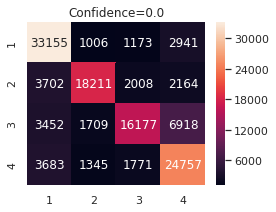

Total= 124172  Classified= 119330 Discarded= 4842 recovered percent= 96.10057017685146 discarded percent= 3.899429823148536
Correct= 90644 Incorrect= 28686 Correct %= 75.960781027403 Incorrect %= 24.039218972597002


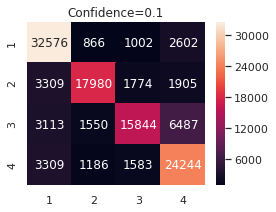

Total= 124172  Classified= 114893 Discarded= 9279 recovered percent= 92.52730084076926 discarded percent= 7.472699159230745
Correct= 89094 Incorrect= 25799 Correct %= 77.5451942241912 Incorrect %= 22.454805775808794


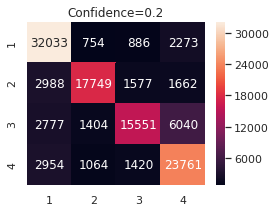

Total= 124172  Classified= 110554 Discarded= 13618 recovered percent= 89.03295428921174 discarded percent= 10.967045710788263
Correct= 87426 Incorrect= 23128 Correct %= 79.0799066519529 Incorrect %= 20.920093348047107


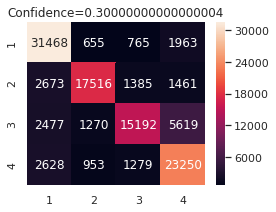

Total= 124172  Classified= 106286 Discarded= 17886 recovered percent= 85.59578648970782 discarded percent= 14.404213510292173
Correct= 85649 Incorrect= 20637 Correct %= 80.58351993677437 Incorrect %= 19.416480063225634


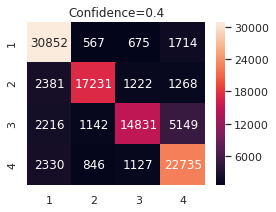

Total= 124172  Classified= 101877 Discarded= 22295 recovered percent= 82.04506652063267 discarded percent= 17.95493347936733
Correct= 83710 Incorrect= 18167 Correct %= 82.16771204491691 Incorrect %= 17.83228795508309


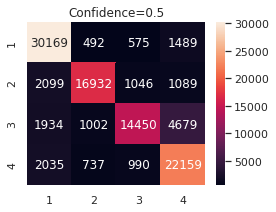

Total= 124172  Classified= 97223 Discarded= 26949 recovered percent= 78.29703959024579 discarded percent= 21.702960409754212
Correct= 81537 Incorrect= 15686 Correct %= 83.86595764376742 Incorrect %= 16.134042356232577


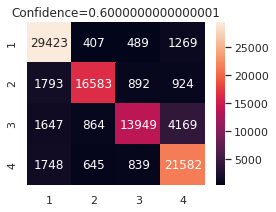

Total= 124172  Classified= 92045 Discarded= 32127 recovered percent= 74.1270173630126 discarded percent= 25.87298263698741
Correct= 78945 Incorrect= 13100 Correct %= 85.76783095225161 Incorrect %= 14.232169047748384


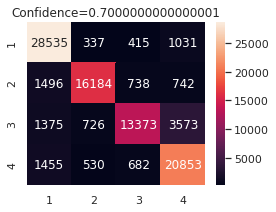

Total= 124172  Classified= 85930 Discarded= 38242 recovered percent= 69.20239667557904 discarded percent= 30.79760332442096
Correct= 75591 Incorrect= 10339 Correct %= 87.9681135808216 Incorrect %= 12.031886419178402


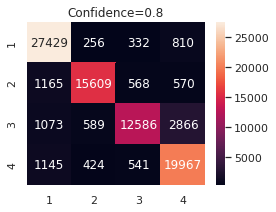

Total= 124172  Classified= 77121 Discarded= 47051 recovered percent= 62.108204748252426 discarded percent= 37.89179525174758
Correct= 70175 Incorrect= 6946 Correct %= 90.99337404857302 Incorrect %= 9.00662595142698


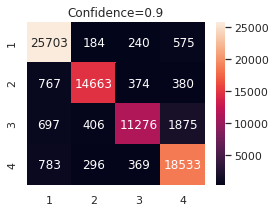

In [58]:
from pycm import *
stats={}
for threshold in np.arange(0,1,0.1):
    result=cm_for_threshold(LX_test,y_test_predicted,y_test,threshold=threshold,dump_errors=True)
    print("Total=",result['total']," Classified=", result['recovered'], 
          "Discarded=",result['discarded'], "recovered percent=",result['recovered']/result['total'] *100, "discarded percent=",(result['total']-result['recovered'])/result['total']*100)
    print('Correct=',result['correct'],'Incorrect=',result['incorrect'], 
          'Correct %=',result['correct']/result['recovered'] * 100,'Incorrect %=',result['incorrect']/result['recovered'] * 100) 
    cm=result['cm']
    cm_heatmap_for(cm.table, threshold)
#    print(cm)
    stats[str(threshold)]=result

In [ ]:
def export_errors(file_name,labels, predictions, actuals):
    with open(file_name, "w") as file:
        for index,pred in enumerate(predictions):
            if actuals[index]!=pred:
                file.write(labels[index]+','+ str(pred)+ ','+str(actuals[index])+'\n')
                
def export_matrix(file_name,labels, matrix):
    with open(file_name, "w") as file:
        for index,mat_row in enumerate(matrix):
            file.write(labels[index])
            for elem in mat_row:
                file.write(','+ str(elem))
            file.write('\n')
                

In [60]:
export_matrix('rep3-test_predictions.csv',LX_test, y_test_predicted)
export_matrix('rep3-test_actuals.csv',LX_test, y_test)


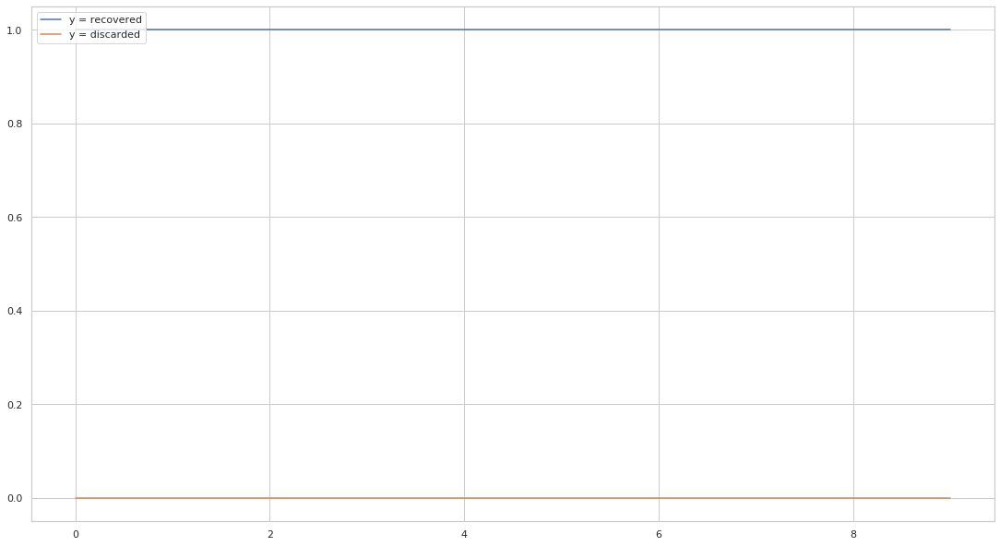

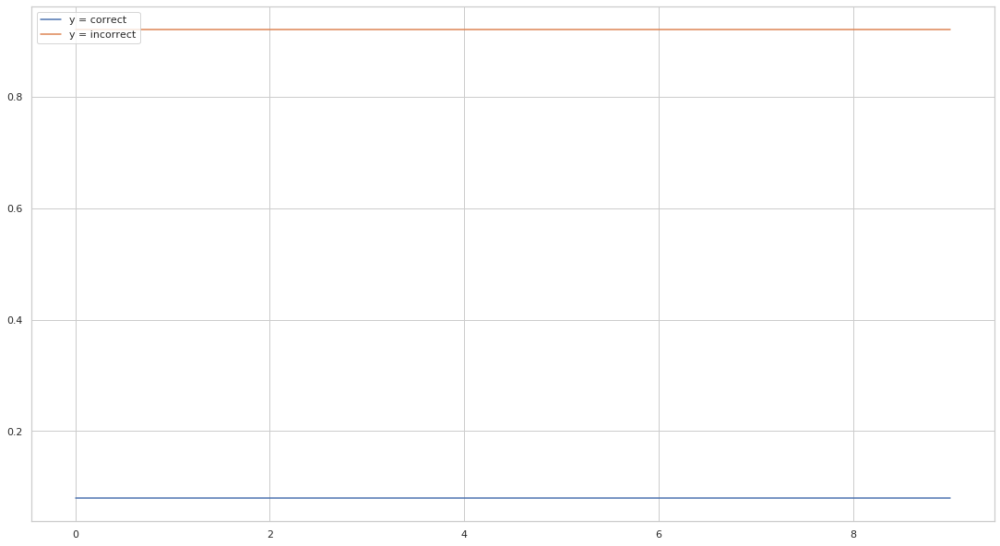

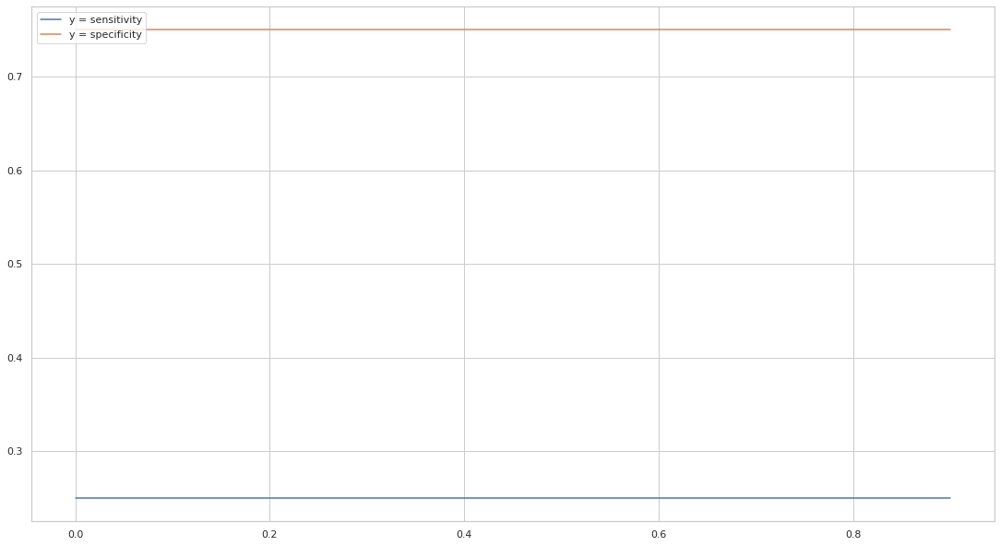

[0.0, 0.1, 0.2, 0.30000000000000004, 0.4, 0.5, 0.6000000000000001, 0.7000000000000001, 0.8, 0.9] [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0] [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0] [0.08, 0.08, 0.08, 0.08, 0.08, 0.08, 0.08, 0.08, 0.08, 0.08] [0.92, 0.92, 0.92, 0.92, 0.92, 0.92, 0.92, 0.92, 0.92, 0.92] [0.08, 0.08, 0.08, 0.08, 0.08, 0.08, 0.08, 0.08, 0.08, 0.08]
0.0 1.0 0.0 0.08 0.92
0.1 1.0 0.0 0.08 0.92
0.2 1.0 0.0 0.08 0.92
0.30000000000000004 1.0 0.0 0.08 0.92
0.4 1.0 0.0 0.08 0.92
0.5 1.0 0.0 0.08 0.92
0.6000000000000001 1.0 0.0 0.08 0.92
0.7000000000000001 1.0 0.0 0.08 0.92
0.8 1.0 0.0 0.08 0.92
0.9 1.0 0.0 0.08 0.92


In [83]:
def calc_avg(dict):
    vals=np.array(list(dict.values()))
    return(np.mean(vals))

def calculate_stats(result):
    confidence=[]
    recovered=[]
    discarded=[]
    correct=[]
    incorrect=[]
    accuracy=[]    
    sensitivity=[]
    specificity=[]
    roc=[]
    for conf,scores in result.items():
        confidence.append(float(conf))
        recovered.append(scores['recovered']/scores['total'])
        discarded.append(scores['discarded']/scores['total'])
        correct.append(scores['correct']/scores['recovered'])
        incorrect.append(scores['incorrect']/scores['recovered'])
        accuracy.append(scores['cm'].Overall_ACC)
        sensitivity.append(calc_avg(scores['cm'].TPR))
        specificity.append(calc_avg(scores['cm'].TNR))
        roc.append(calc_avg(scores['cm'].AUC))    
    return(confidence,recovered,discarded,correct,incorrect,accuracy,sensitivity,specificity,roc)
        
    plt.gca().set_color_cycle(['red', 'green', 'blue', 'yellow'])

def graph_summary_for(result):
    confidence,recovered,discarded,correct,incorrect,accuracy,sensitivity,specificity,roc=calculate_stats(result)
    plt.plot(recovered)
    plt.plot(discarded)
    plt.legend(['y = recovered', 'y = discarded'], loc='upper left')
    plt.show()
    
    plt.plot(correct)
    plt.plot(incorrect)
    plt.legend(['y = correct', 'y = incorrect'], loc='upper left')
    plt.show()
    
    plt.plot(confidence,sensitivity)
    plt.plot(confidence,specificity)
    plt.legend(['y = sensitivity', 'y = specificity'], loc='upper left')
    plt.show()
    print(confidence,recovered,discarded,correct,incorrect,accuracy)
    for index,cf in enumerate(confidence):
        print(cf,recovered[index],discarded[index],correct[index],incorrect[index])

graph_summary_for(stats)

[2584, 2304, 280, 0.891640866873065, 0.10835913312693499]
Predict          1      2      3      4      
Actual
1                516    43     20     15     

2                121    271    12     7      

3                4      12     762    13     

4                7      11     15     755    





Overall Statistics : 

95% CI                                                           (0.87966,0.90363)
AUNP                                                             0.9288
AUNU                                                             0.91339
Bennett S                                                        0.85552
CBA                                                              0.83832
Chi-Squared                                                      5459.63637
Chi-Squared DF                                                   9
Conditional Entropy                                              0.53897
Cramer V                                                         0.83922
Cross Entro

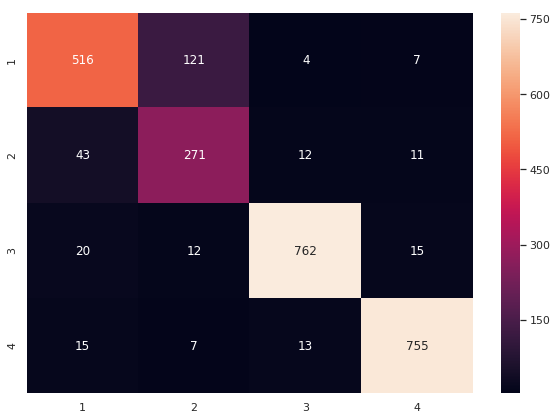

In [42]:
cm = ConfusionMatrix(actual_vector=av, predict_vector=pv)
cm_table=cm.table
print(totals_for(cm_table))
print(cm)
#cm.relabel(mapping={0:"117",1:"63",2:"81",3:"103",4:"999"})
df_cm = pd.DataFrame(cm.table, index =[1,2,3,4],
                  columns = [1,2,3,4])
plt.figure(figsize = (10,7))
sn.heatmap(df_cm, annot=True,fmt='g' )

In [ ]:
threshold=0.9
pv,av=vectorise_selected_with_threshold(y_test_predicted,y_test,threshold)
recognised=np.count_nonzero(pv)


In [ ]:
cm = ConfusionMatrix(actual_vector=av, predict_vector=pv)
cm_table=cm.table
print(totals_for(cm_table))
print(cm)
#cm.relabel(mapping={0:"117",1:"63",2:"81",3:"103",4:"999"})
df_cm = pd.DataFrame(cm.table, index =[1,2,3,4],
                  columns = [1,2,3,4])
plt.figure(figsize = (10,7))
sn.heatmap(df_cm, annot=True,fmt='g' )